In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
import warnings

warnings.filterwarnings('ignore')

# ────────────────────────────────────────────────
#  SETTINGS
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("muted")
plt.rcParams['figure.dpi'] = 120
plt.rcParams['savefig.dpi'] = 150
plt.rcParams['figure.figsize'] = (10, 5)

FILE_PATH = "003_manchester_processed.csv"   # ← change if needed

# Key variables to focus on
KEY_VARS = ['TREFMXAV_U', 'TREFHT', 'PRECT', 'FLNS', 'FSNS', 'PRSN', 'QBOT', 'UBOT', 'VBOT']

In [2]:
# ────────────────────────────────────────────────
# 1. Load & Prepare
# ────────────────────────────────────────────────
df = pd.read_csv(FILE_PATH, parse_dates=['time'])
df['year'] = df['time'].dt.year
df['month'] = df['time'].dt.month
df['dayofyear'] = df['time'].dt.dayofyear

print("Shape:", df.shape)
print("Date range:", df['time'].min(), "–", df['time'].max())
print("Missing values:\n", df.isna().sum())

Shape: (26325, 16)
Date range: 2006-01-02 00:00:00 – 2080-12-31 00:00:00
Missing values:
 time          0
TREFMXAV_U    0
FLNS          0
FSNS          0
PRECT         0
PRSN          0
QBOT          0
TREFHT        0
UBOT          0
VBOT          0
lat           0
lon           0
year          0
month         0
day           0
dayofyear     0
dtype: int64


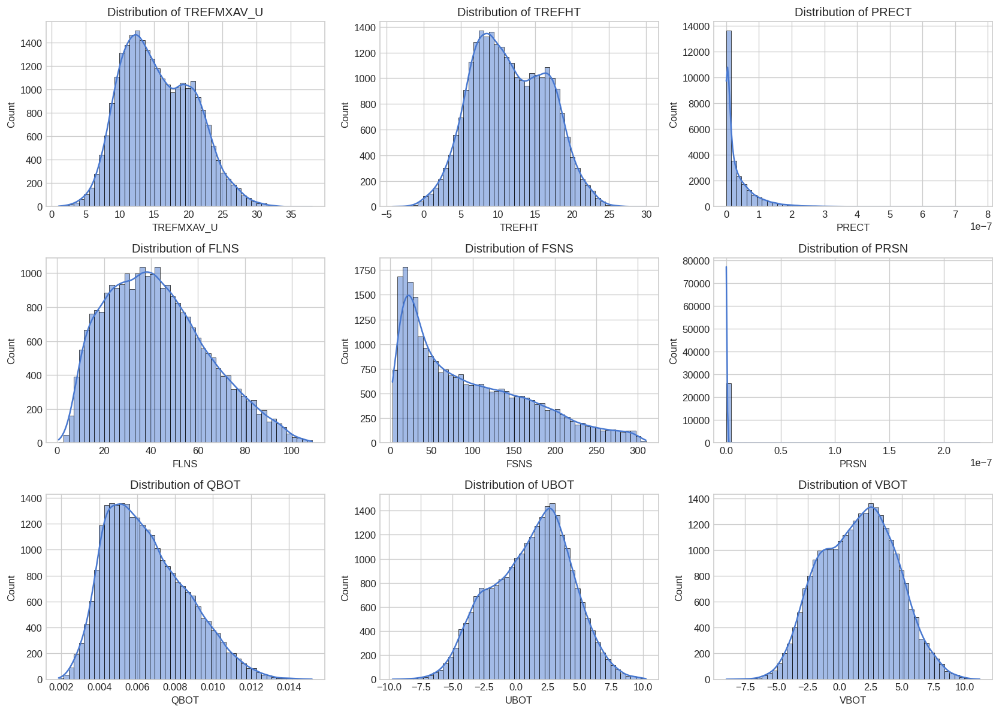

In [3]:
# ────────────────────────────────────────────────
# 2. Distributions – Histograms
# ────────────────────────────────────────────────
fig, axes = plt.subplots(3, 3, figsize=(14, 10))
axes = axes.ravel()

for i, var in enumerate(KEY_VARS):
    sns.histplot(data=df, x=var, ax=axes[i], kde=True, bins=50)
    axes[i].set_title(f'Distribution of {var}')

plt.tight_layout()
plt.savefig('distributions_key_vars.png', bbox_inches='tight')
plt.show()

Distributions are approximately normal for temperatures (with clear spread) but right-skewed for precipitation variables (many near-zero days + rare heavy events).

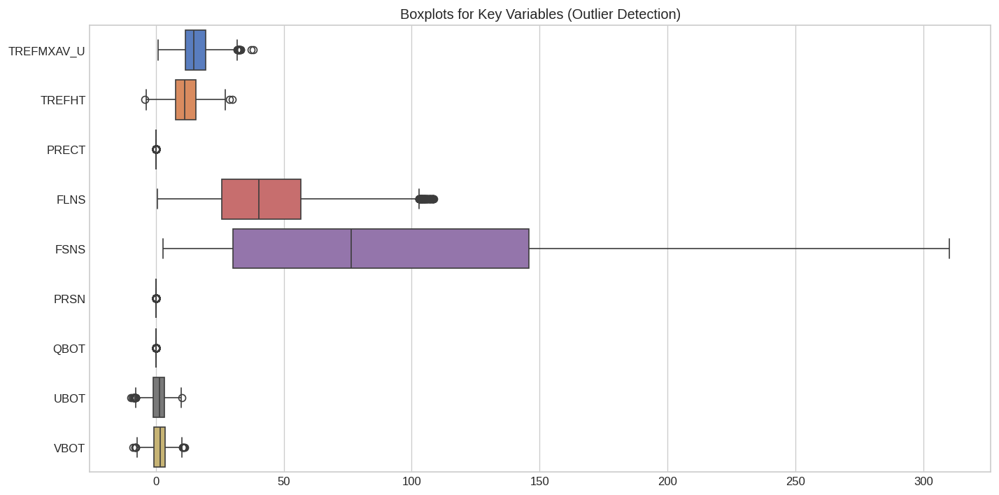

In [4]:
# ────────────────────────────────────────────────
# 3. Boxplots (outlier overview)
# ────────────────────────────────────────────────
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[KEY_VARS], orient='h', whis=1.5)
plt.title('Boxplots for Key Variables (Outlier Detection)')
plt.tight_layout()
plt.savefig('boxplots_key_vars.png', bbox_inches='tight')
plt.show()

Boxplots confirm occasional outliers in fluxes and precip, which is physically expected in daily climate data and unlikely to harm prediction if models handle extremes well.

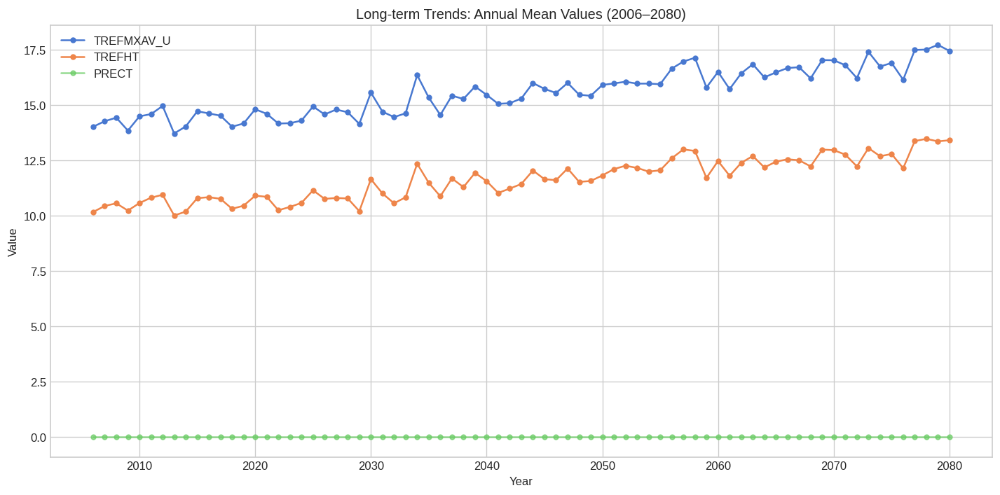

In [5]:
# ────────────────────────────────────────────────
# 4. Long-term trend – Annual means
# ────────────────────────────────────────────────
annual = df.groupby('year')[['TREFMXAV_U', 'TREFHT', 'PRECT']].mean().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(annual['year'], annual['TREFMXAV_U'], label='TREFMXAV_U', marker='o', ms=4)
plt.plot(annual['year'], annual['TREFHT'],    label='TREFHT',    marker='o', ms=4)
plt.plot(annual['year'], annual['PRECT'],     label='PRECT',     marker='o', ms=4, alpha=0.7)
plt.title('Long-term Trends: Annual Mean Values (2006–2080)')
plt.xlabel('Year')
plt.ylabel('Value')
plt.legend()
plt.tight_layout()
plt.savefig('long_term_annual_trends.png', bbox_inches='tight')
plt.show()

Long-term trends: Strong warming signal. Annual mean TREFMXAV_U rises from ≈14.02 in 2006 to ≈17.44 in 2080 (+3.42 °C overall). TREFHT follows the same upward trajectory. Precipitation shows interannual fluctuation but no clear monotonic trend.

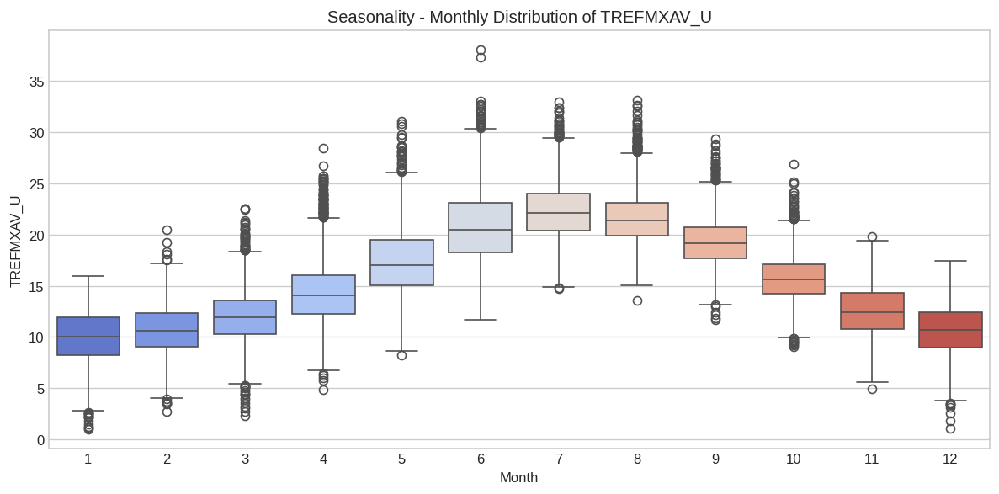

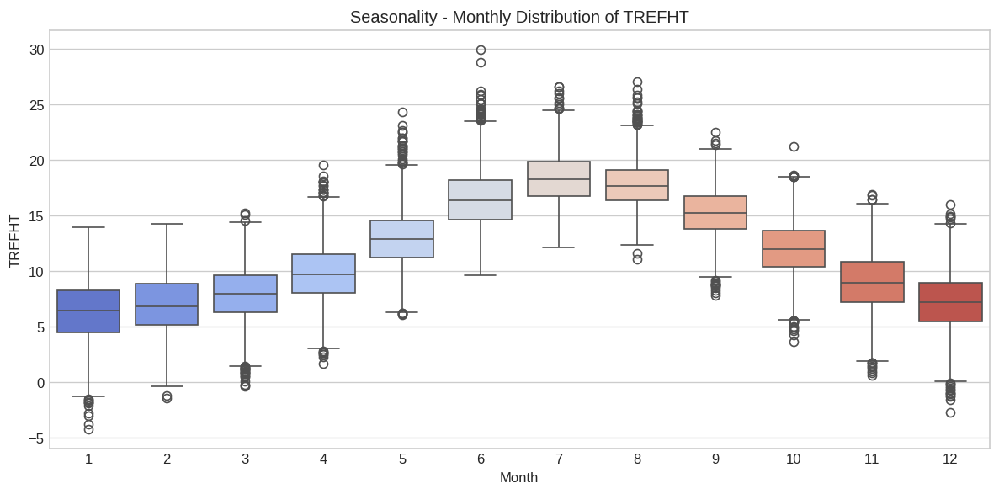

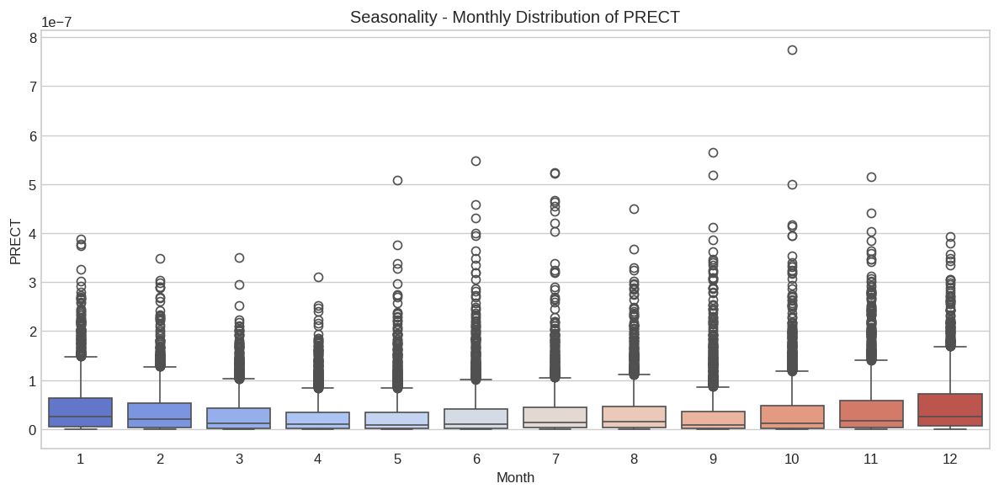

In [6]:
# ────────────────────────────────────────────────
# 5. Seasonality – Monthly boxplots
# ────────────────────────────────────────────────
for var in ['TREFMXAV_U', 'TREFHT', 'PRECT']:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x='month', y=var, data=df, palette='coolwarm')
    plt.title(f'Seasonality - Monthly Distribution of {var}')
    plt.xlabel('Month')
    plt.tight_layout()
    plt.savefig(f'seasonality_monthly_{var.lower()}.png', bbox_inches='tight')
    plt.show()

Seasonality: Classic Northern Hemisphere cycle. Monthly means peak in July (≈22.35 for TREFMXAV_U) and bottom in January (≈9.96). Boxplots reveal higher variability in winter for temperature and more outlier-prone precipitation in transitional seasons. Day-of-year smoothed cycle confirms the smooth sinusoidal pattern.

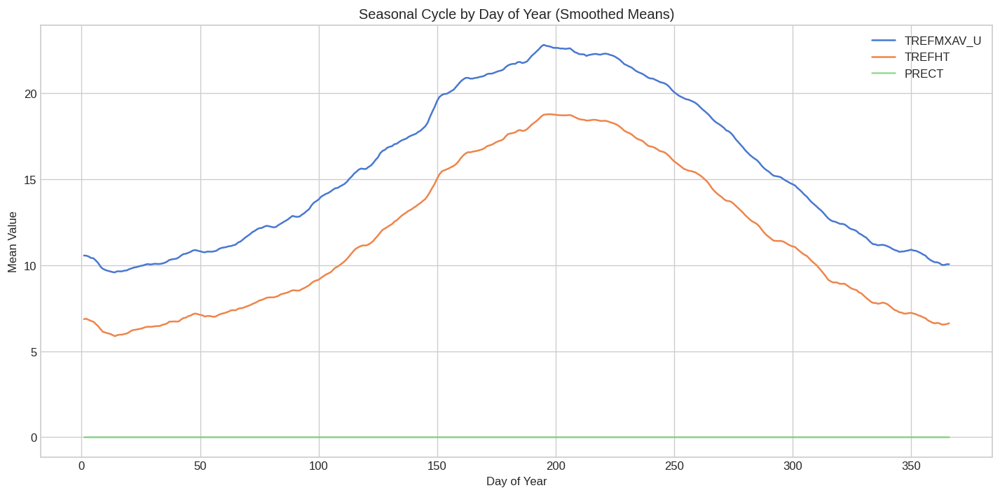

In [7]:
# ────────────────────────────────────────────────
# 6. Smoothed seasonal cycle by day of year
# ────────────────────────────────────────────────
doy_mean = df.groupby('dayofyear')[['TREFMXAV_U', 'TREFHT', 'PRECT']].mean()
# 7-day rolling mean for smoother curve
doy_smooth = doy_mean.rolling(window=7, center=True, min_periods=1).mean()

plt.figure(figsize=(12, 6))
plt.plot(doy_smooth.index, doy_smooth['TREFMXAV_U'], label='TREFMXAV_U')
plt.plot(doy_smooth.index, doy_smooth['TREFHT'],    label='TREFHT')
plt.plot(doy_smooth.index, doy_smooth['PRECT'],     label='PRECT', alpha=0.7)
plt.title('Seasonal Cycle by Day of Year (Smoothed Means)')
plt.xlabel('Day of Year')
plt.ylabel('Mean Value')
plt.legend()
plt.tight_layout()
plt.savefig('seasonal_cycle_dayofyear.png', bbox_inches='tight')
plt.show()

Fluctuation: Daily noise is high, but seasonality dominates; interannual variability is visible in the annual line plot (e.g., cooler years around 2009–2010). The 74-year span makes long-term climate signal clear while preserving short-term weather realism.

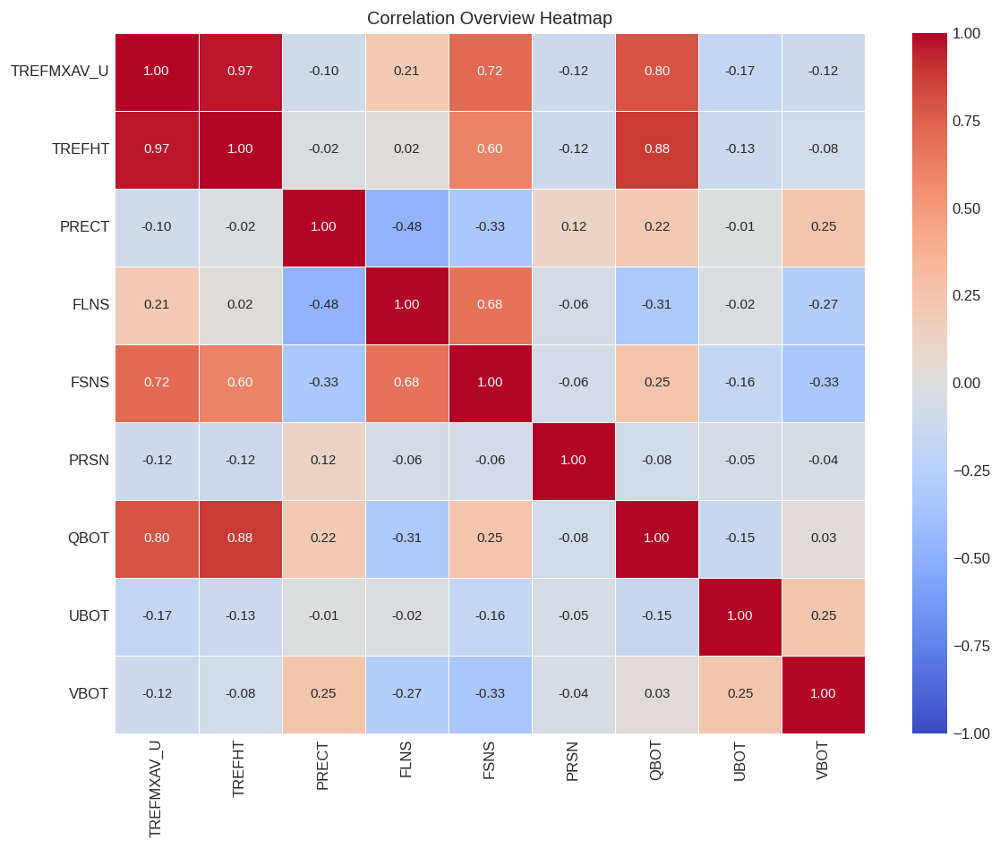

In [8]:
# ────────────────────────────────────────────────
# 7. Correlation heatmap
# ────────────────────────────────────────────────
corr = df[KEY_VARS].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1,
            linewidths=0.5, annot_kws={'size': 9})
plt.title('Correlation Overview Heatmap')
plt.tight_layout()
plt.savefig('correlation_heatmap.png', bbox_inches='tight')
plt.show()

Correlation Overview:
Strong positive correlations among temperature variables (0.97) and with humidity QBOT (0.80–0.88). Radiation fluxes correlate positively with temperature but negatively with precipitation. Precip variables show weak negative or near-zero links to temperature — typical for mid-latitude climates.

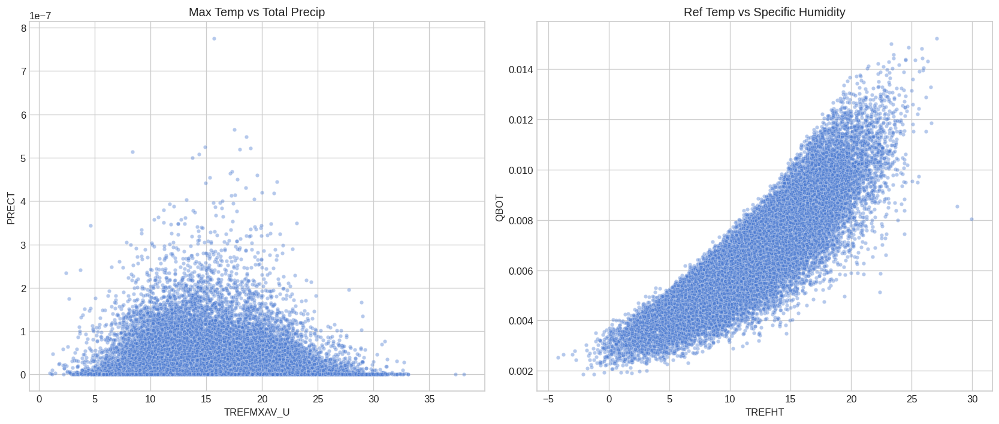

In [9]:
# ────────────────────────────────────────────────
# 8. Example multivariate scatter plots
# ────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.scatterplot(x='TREFMXAV_U', y='PRECT', data=df, ax=axes[0], alpha=0.4, s=15)
axes[0].set_title('Max Temp vs Total Precip')
axes[0].set_xlabel('TREFMXAV_U')
axes[0].set_ylabel('PRECT')

sns.scatterplot(x='TREFHT', y='QBOT', data=df, ax=axes[1], alpha=0.4, s=15)
axes[1].set_title('Ref Temp vs Specific Humidity')
axes[1].set_xlabel('TREFHT')
axes[1].set_ylabel('QBOT')

plt.tight_layout()
plt.savefig('multivariate_scatter_examples.png', bbox_inches='tight')
plt.show()

Univariate: Already covered in the histograms above — temperatures are symmetric, precipitation heavily skewed (many dry days).

Multivariate: Scatter samples confirm a mild negative relationship between temperature and precipitation (warmer conditions slightly drier on average) and a very tight positive link between temperature and humidity.

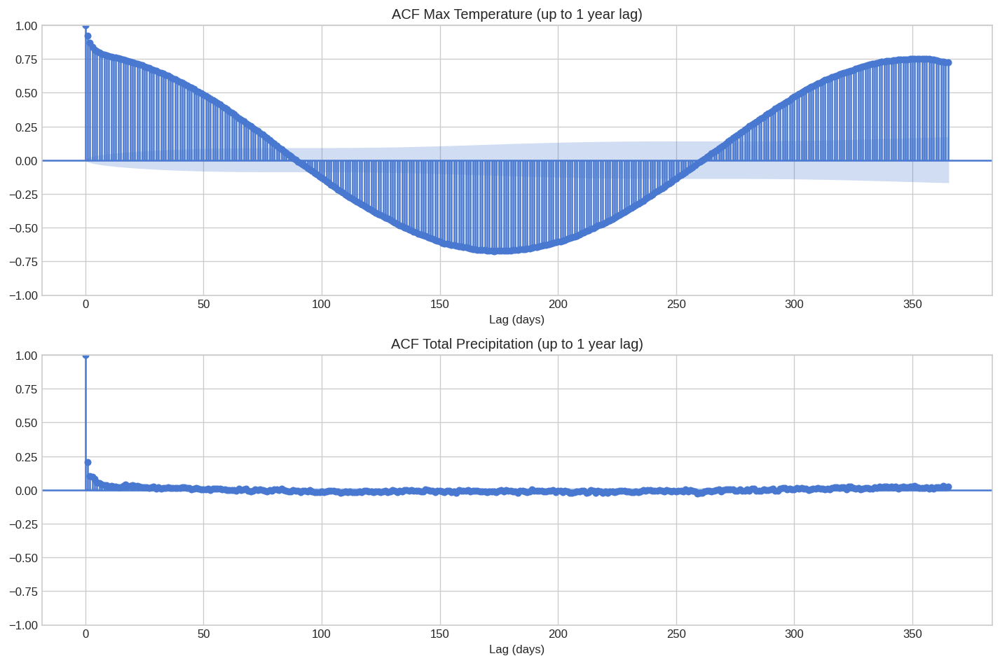

In [10]:
# ────────────────────────────────────────────────
# 9. ACF (lag analysis) – up to 365 days
# ────────────────────────────────────────────────
fig, axes = plt.subplots(2, 1, figsize=(12, 8))

plot_acf(df['TREFMXAV_U'], lags=365, ax=axes[0], title='ACF Max Temperature (up to 1 year lag)')
axes[0].set_xlabel('Lag (days)')

plot_acf(df['PRECT'], lags=365, ax=axes[1], title='ACF Total Precipitation (up to 1 year lag)')
axes[1].set_xlabel('Lag (days)')

plt.tight_layout()
plt.savefig('lag_analysis_acf.png', bbox_inches='tight')
plt.show()

Lag analysis: Autocorrelation Function (ACF) up to 365-day lags shows very strong seasonal persistence in temperature (peaks recur every ≈365 days). Precipitation autocorrelation decays faster with weaker seasonal echo — useful for time-series feature engineering or lag-based models.

Dataset 004

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
import warnings

warnings.filterwarnings('ignore')

# ────────────────────────────────────────────────
#  SETTINGS
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("muted")
plt.rcParams['figure.dpi'] = 120
plt.rcParams['savefig.dpi'] = 150
plt.rcParams['figure.figsize'] = (10, 5)

FILE_PATH = "004_manchester_processed.csv"   # ← change if needed

# Key variables to focus on
KEY_VARS = ['TREFMXAV_U', 'TREFHT', 'PRECT', 'FLNS', 'FSNS', 'PRSN', 'QBOT', 'UBOT', 'VBOT']

In [12]:
# ────────────────────────────────────────────────
# 1. Load & Prepare
# ────────────────────────────────────────────────
df = pd.read_csv(FILE_PATH, parse_dates=['time'])
df['year'] = df['time'].dt.year
df['month'] = df['time'].dt.month
df['dayofyear'] = df['time'].dt.dayofyear

print("Shape:", df.shape)
print("Date range:", df['time'].min(), "–", df['time'].max())
print("Missing values:\n", df.isna().sum())

Shape: (26348, 16)
Date range: 2006-01-02 00:00:00 – 2080-12-31 00:00:00
Missing values:
 time          0
TREFMXAV_U    0
FLNS          0
FSNS          0
PRECT         0
PRSN          0
QBOT          0
TREFHT        0
UBOT          0
VBOT          0
lat           0
lon           0
year          0
month         0
day           0
dayofyear     0
dtype: int64


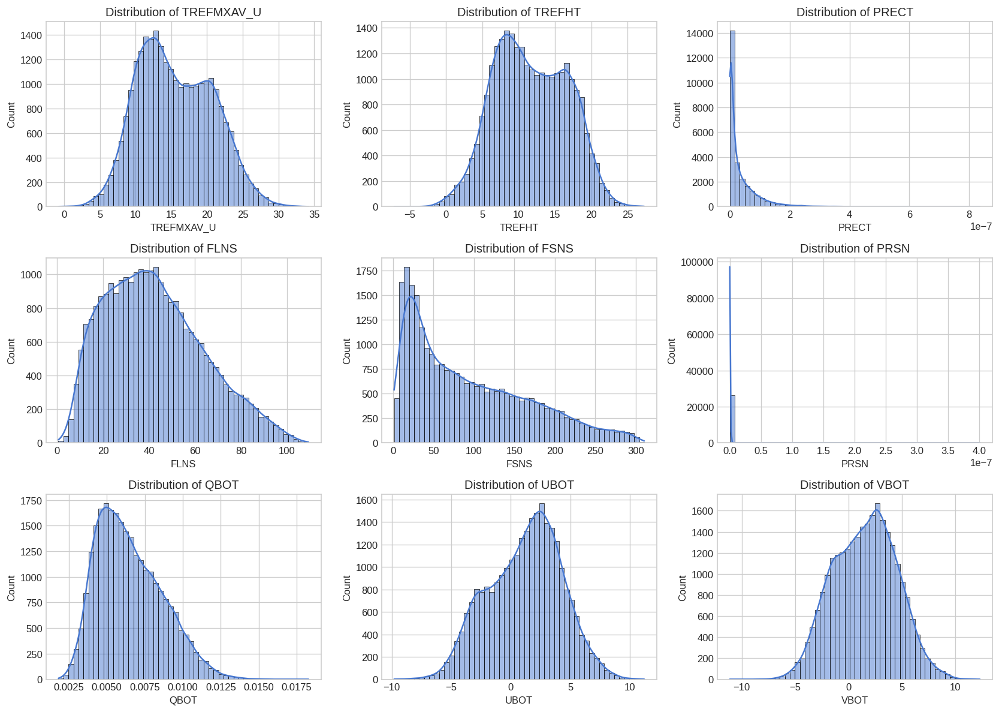

In [13]:
# ────────────────────────────────────────────────
# 2. Distributions – Histograms
# ────────────────────────────────────────────────
fig, axes = plt.subplots(3, 3, figsize=(14, 10))
axes = axes.ravel()

for i, var in enumerate(KEY_VARS):
    sns.histplot(data=df, x=var, ax=axes[i], kde=True, bins=50)
    axes[i].set_title(f'Distribution of {var}')

plt.tight_layout()
plt.savefig('distributions_key_vars.png', bbox_inches='tight')
plt.show()

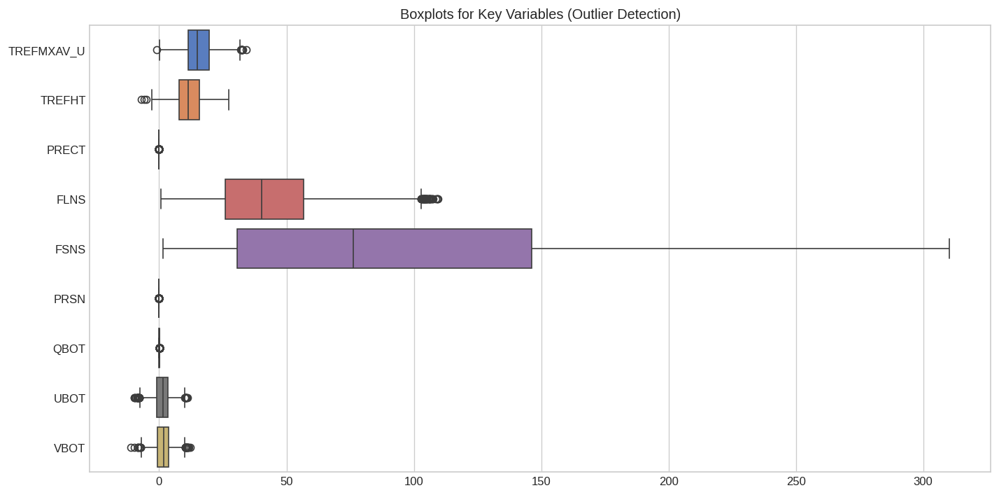

In [14]:
# ────────────────────────────────────────────────
# 3. Boxplots (outlier overview)
# ────────────────────────────────────────────────
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[KEY_VARS], orient='h', whis=1.5)
plt.title('Boxplots for Key Variables (Outlier Detection)')
plt.tight_layout()
plt.savefig('boxplots_key_vars.png', bbox_inches='tight')
plt.show()

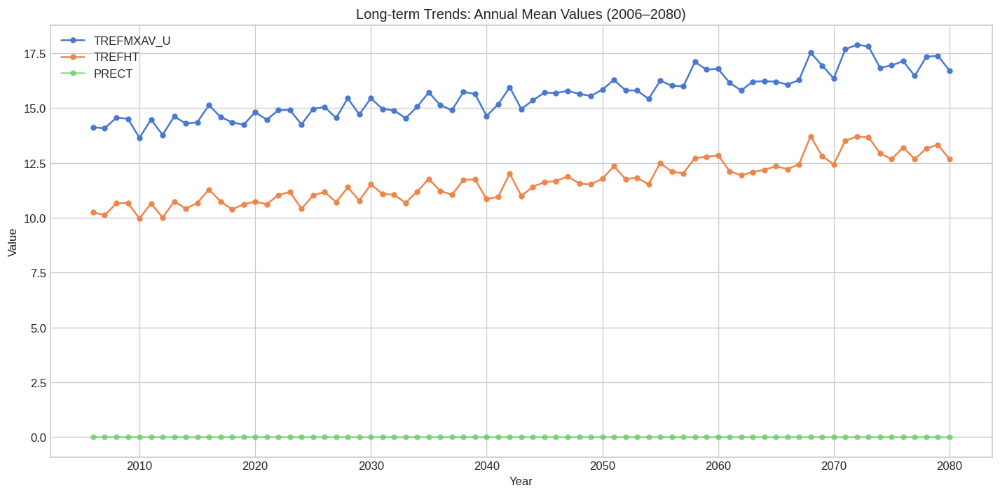

In [15]:
# ────────────────────────────────────────────────
# 4. Long-term trend – Annual means
# ────────────────────────────────────────────────
annual = df.groupby('year')[['TREFMXAV_U', 'TREFHT', 'PRECT']].mean().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(annual['year'], annual['TREFMXAV_U'], label='TREFMXAV_U', marker='o', ms=4)
plt.plot(annual['year'], annual['TREFHT'],    label='TREFHT',    marker='o', ms=4)
plt.plot(annual['year'], annual['PRECT'],     label='PRECT',     marker='o', ms=4, alpha=0.7)
plt.title('Long-term Trends: Annual Mean Values (2006–2080)')
plt.xlabel('Year')
plt.ylabel('Value')
plt.legend()
plt.tight_layout()
plt.savefig('long_term_annual_trends.png', bbox_inches='tight')
plt.show()

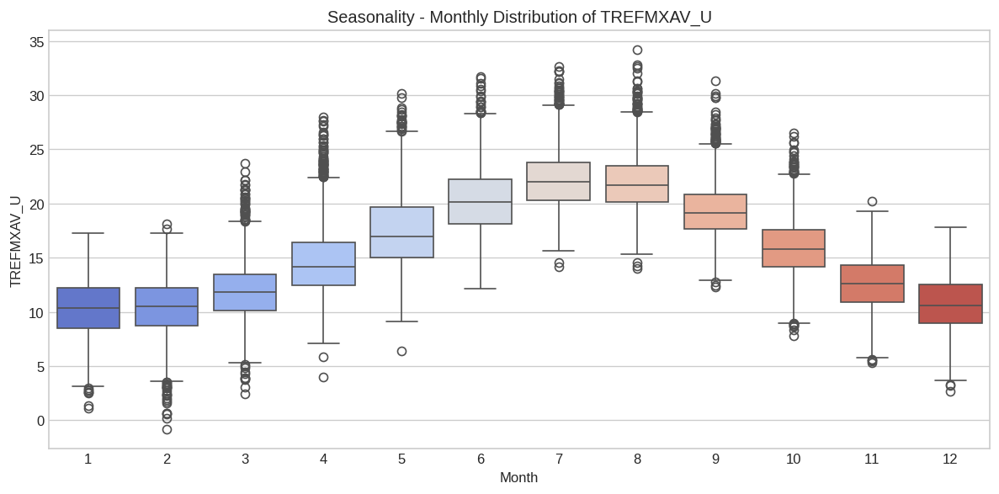

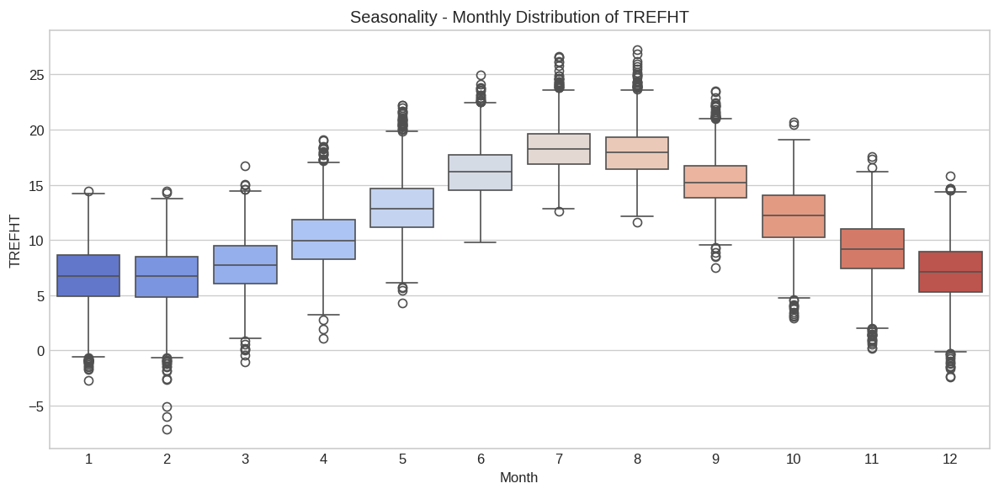

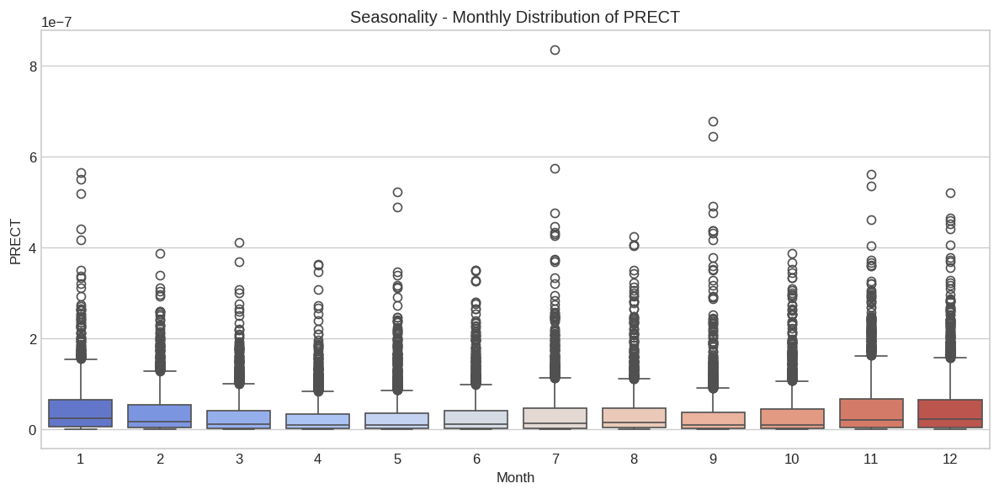

In [16]:
# ────────────────────────────────────────────────
# 5. Seasonality – Monthly boxplots
# ────────────────────────────────────────────────
for var in ['TREFMXAV_U', 'TREFHT', 'PRECT']:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x='month', y=var, data=df, palette='coolwarm')
    plt.title(f'Seasonality - Monthly Distribution of {var}')
    plt.xlabel('Month')
    plt.tight_layout()
    plt.savefig(f'seasonality_monthly_{var.lower()}.png', bbox_inches='tight')
    plt.show()

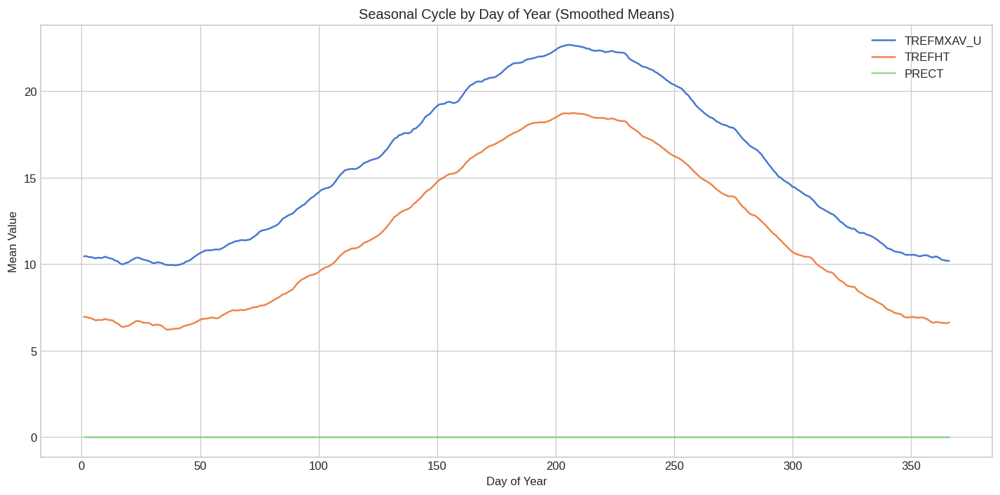

In [17]:
# ────────────────────────────────────────────────
# 6. Smoothed seasonal cycle by day of year
# ────────────────────────────────────────────────
doy_mean = df.groupby('dayofyear')[['TREFMXAV_U', 'TREFHT', 'PRECT']].mean()
# 7-day rolling mean for smoother curve
doy_smooth = doy_mean.rolling(window=7, center=True, min_periods=1).mean()

plt.figure(figsize=(12, 6))
plt.plot(doy_smooth.index, doy_smooth['TREFMXAV_U'], label='TREFMXAV_U')
plt.plot(doy_smooth.index, doy_smooth['TREFHT'],    label='TREFHT')
plt.plot(doy_smooth.index, doy_smooth['PRECT'],     label='PRECT', alpha=0.7)
plt.title('Seasonal Cycle by Day of Year (Smoothed Means)')
plt.xlabel('Day of Year')
plt.ylabel('Mean Value')
plt.legend()
plt.tight_layout()
plt.savefig('seasonal_cycle_dayofyear.png', bbox_inches='tight')
plt.show()

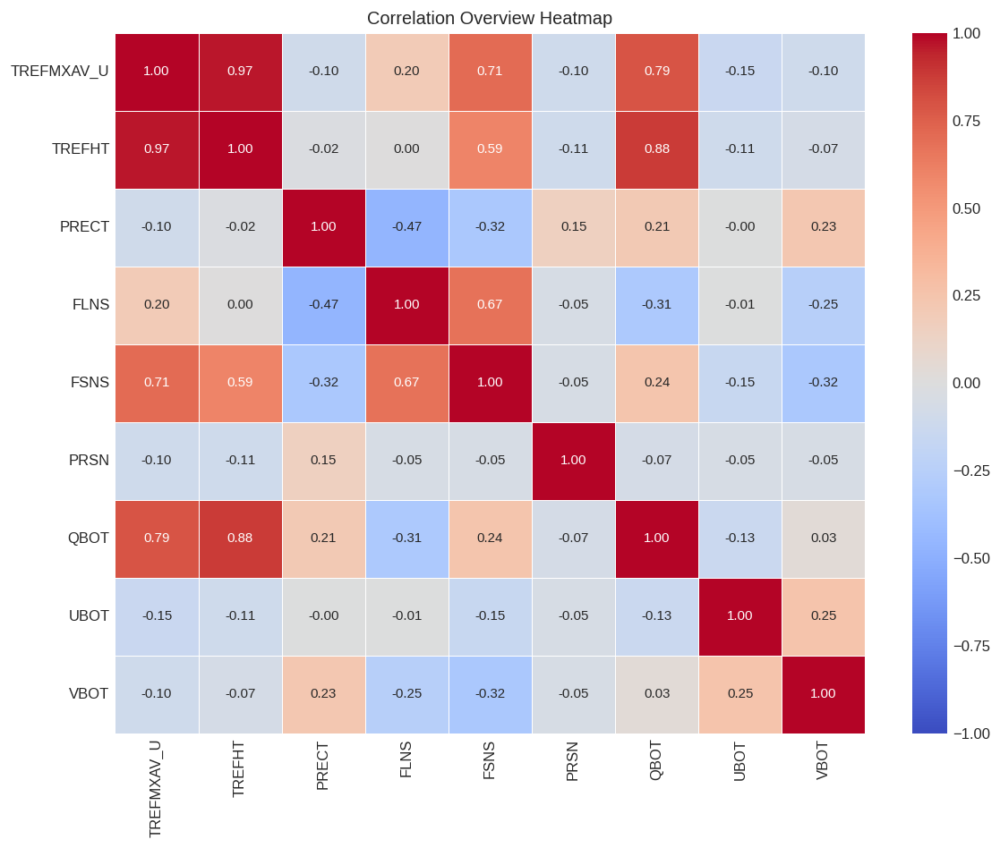

In [18]:
# ────────────────────────────────────────────────
# 7. Correlation heatmap
# ────────────────────────────────────────────────
corr = df[KEY_VARS].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1,
            linewidths=0.5, annot_kws={'size': 9})
plt.title('Correlation Overview Heatmap')
plt.tight_layout()
plt.savefig('correlation_heatmap.png', bbox_inches='tight')
plt.show()

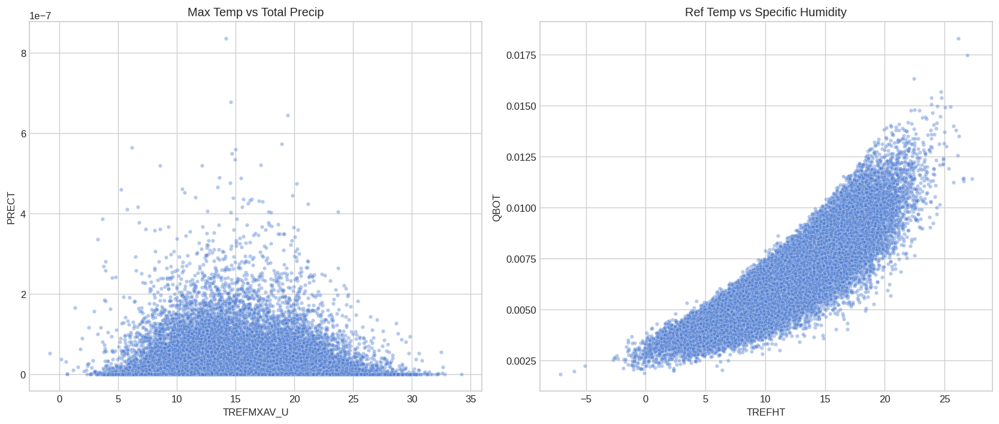

In [19]:
# ────────────────────────────────────────────────
# 8. Example multivariate scatter plots
# ────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.scatterplot(x='TREFMXAV_U', y='PRECT', data=df, ax=axes[0], alpha=0.4, s=15)
axes[0].set_title('Max Temp vs Total Precip')
axes[0].set_xlabel('TREFMXAV_U')
axes[0].set_ylabel('PRECT')

sns.scatterplot(x='TREFHT', y='QBOT', data=df, ax=axes[1], alpha=0.4, s=15)
axes[1].set_title('Ref Temp vs Specific Humidity')
axes[1].set_xlabel('TREFHT')
axes[1].set_ylabel('QBOT')

plt.tight_layout()
plt.savefig('multivariate_scatter_examples.png', bbox_inches='tight')
plt.show()

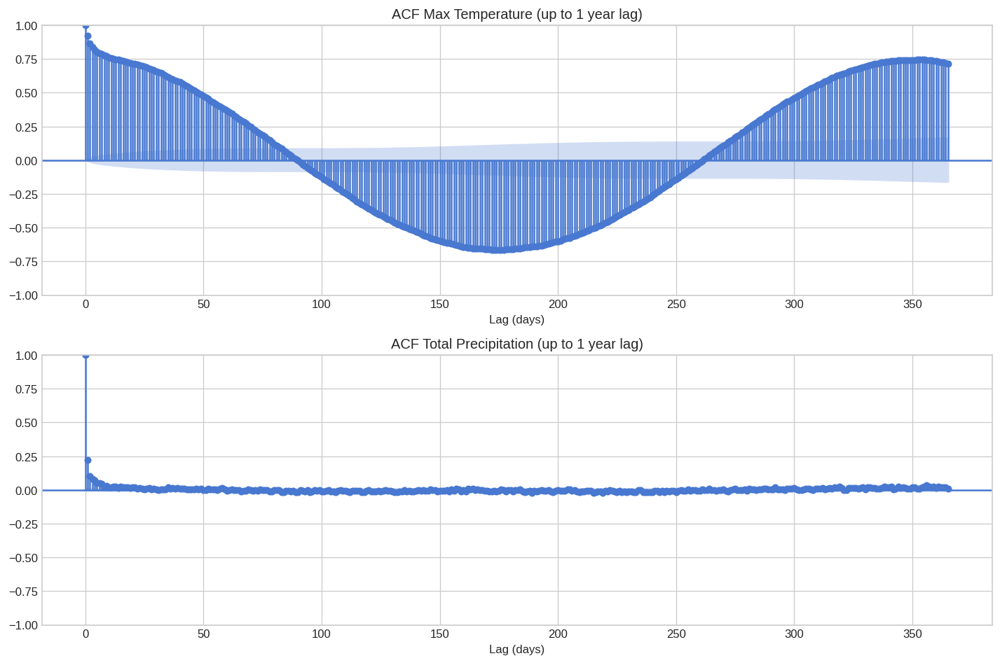

In [20]:
# ────────────────────────────────────────────────
# 9. ACF (lag analysis) – up to 365 days
# ────────────────────────────────────────────────
fig, axes = plt.subplots(2, 1, figsize=(12, 8))

plot_acf(df['TREFMXAV_U'], lags=365, ax=axes[0], title='ACF Max Temperature (up to 1 year lag)')
axes[0].set_xlabel('Lag (days)')

plot_acf(df['PRECT'], lags=365, ax=axes[1], title='ACF Total Precipitation (up to 1 year lag)')
axes[1].set_xlabel('Lag (days)')

plt.tight_layout()
plt.savefig('lag_analysis_acf.png', bbox_inches='tight')
plt.show()

Dataset 005

In [21]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
import warnings

warnings.filterwarnings('ignore')

# ────────────────────────────────────────────────
#  SETTINGS
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("muted")
plt.rcParams['figure.dpi'] = 120
plt.rcParams['savefig.dpi'] = 150
plt.rcParams['figure.figsize'] = (10, 5)

FILE_PATH = "005_manchester_processed.csv"   # ← change if needed

# Key variables to focus on
KEY_VARS = ['TREFMXAV_U', 'TREFHT', 'PRECT', 'FLNS', 'FSNS', 'PRSN', 'QBOT', 'UBOT', 'VBOT']

In [22]:
# ────────────────────────────────────────────────
# 1. Load & Prepare
# ────────────────────────────────────────────────
df = pd.read_csv(FILE_PATH, parse_dates=['time'])
df['year'] = df['time'].dt.year
df['month'] = df['time'].dt.month
df['dayofyear'] = df['time'].dt.dayofyear

print("Shape:", df.shape)
print("Date range:", df['time'].min(), "–", df['time'].max())
print("Missing values:\n", df.isna().sum())

Shape: (26294, 16)
Date range: 2006-01-02 00:00:00 – 2080-12-31 00:00:00
Missing values:
 time          0
TREFMXAV_U    0
FLNS          0
FSNS          0
PRECT         0
PRSN          0
QBOT          0
TREFHT        0
UBOT          0
VBOT          0
lat           0
lon           0
year          0
month         0
day           0
dayofyear     0
dtype: int64


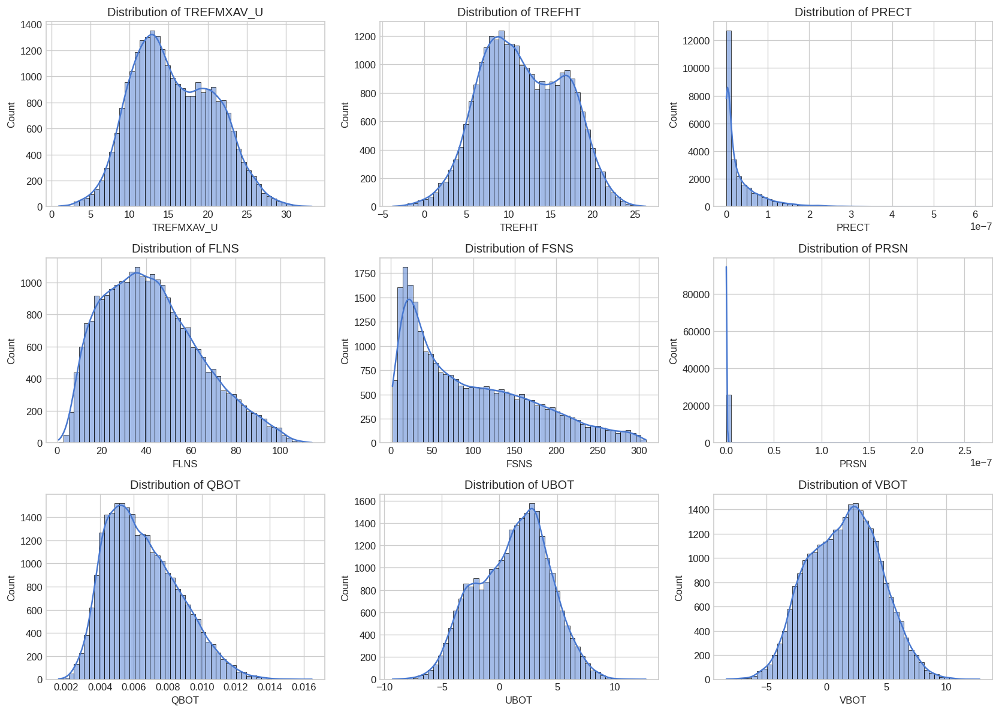

In [23]:
# ────────────────────────────────────────────────
# 2. Distributions – Histograms
# ────────────────────────────────────────────────
fig, axes = plt.subplots(3, 3, figsize=(14, 10))
axes = axes.ravel()

for i, var in enumerate(KEY_VARS):
    sns.histplot(data=df, x=var, ax=axes[i], kde=True, bins=50)
    axes[i].set_title(f'Distribution of {var}')

plt.tight_layout()
plt.savefig('distributions_key_vars.png', bbox_inches='tight')
plt.show()

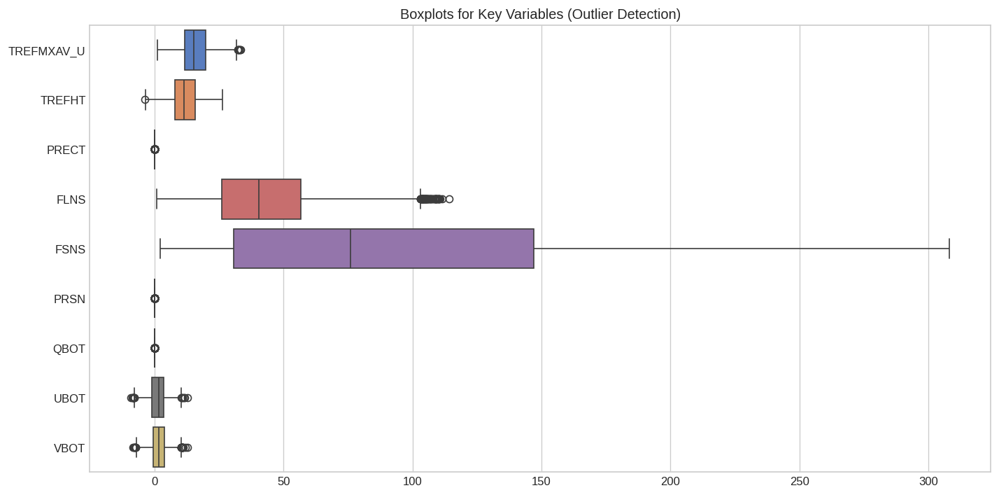

In [24]:
# ────────────────────────────────────────────────
# 3. Boxplots (outlier overview)
# ────────────────────────────────────────────────
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[KEY_VARS], orient='h', whis=1.5)
plt.title('Boxplots for Key Variables (Outlier Detection)')
plt.tight_layout()
plt.savefig('boxplots_key_vars.png', bbox_inches='tight')
plt.show()

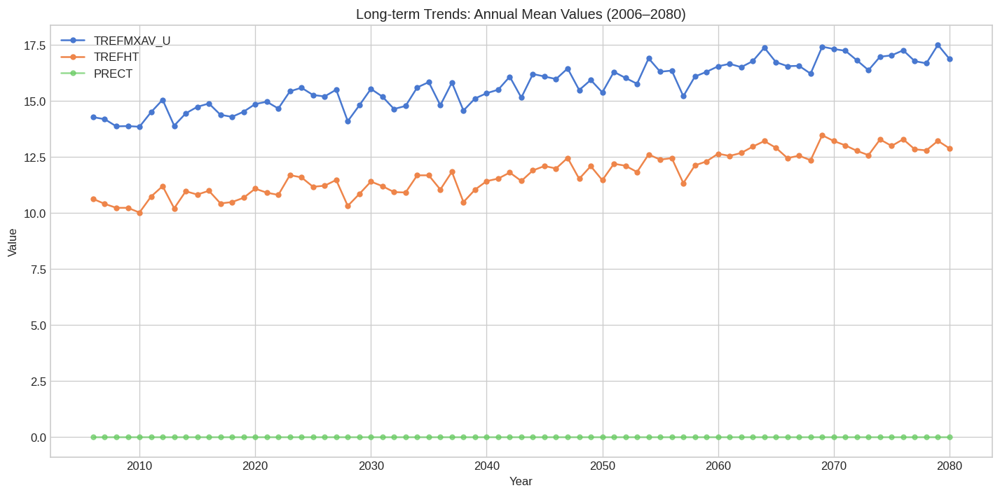

In [25]:
# ────────────────────────────────────────────────
# 4. Long-term trend – Annual means
# ────────────────────────────────────────────────
annual = df.groupby('year')[['TREFMXAV_U', 'TREFHT', 'PRECT']].mean().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(annual['year'], annual['TREFMXAV_U'], label='TREFMXAV_U', marker='o', ms=4)
plt.plot(annual['year'], annual['TREFHT'],    label='TREFHT',    marker='o', ms=4)
plt.plot(annual['year'], annual['PRECT'],     label='PRECT',     marker='o', ms=4, alpha=0.7)
plt.title('Long-term Trends: Annual Mean Values (2006–2080)')
plt.xlabel('Year')
plt.ylabel('Value')
plt.legend()
plt.tight_layout()
plt.savefig('long_term_annual_trends.png', bbox_inches='tight')
plt.show()

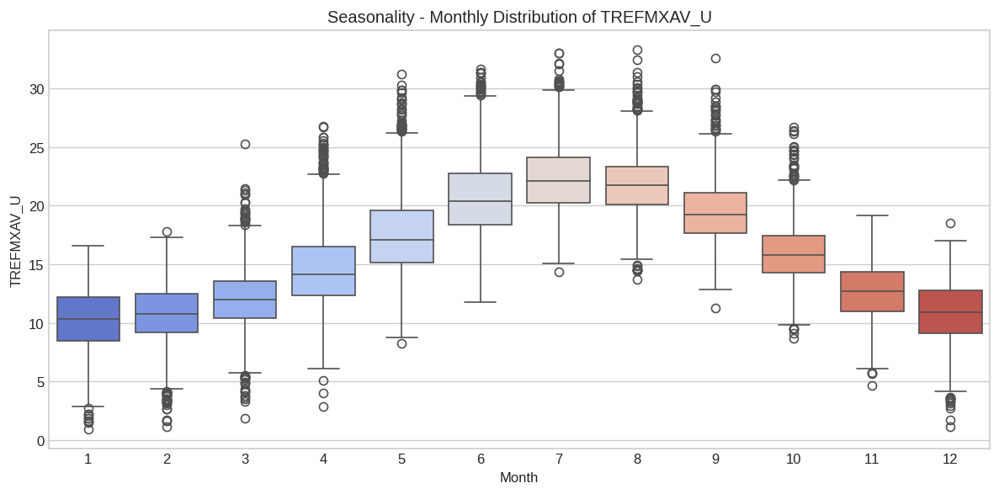

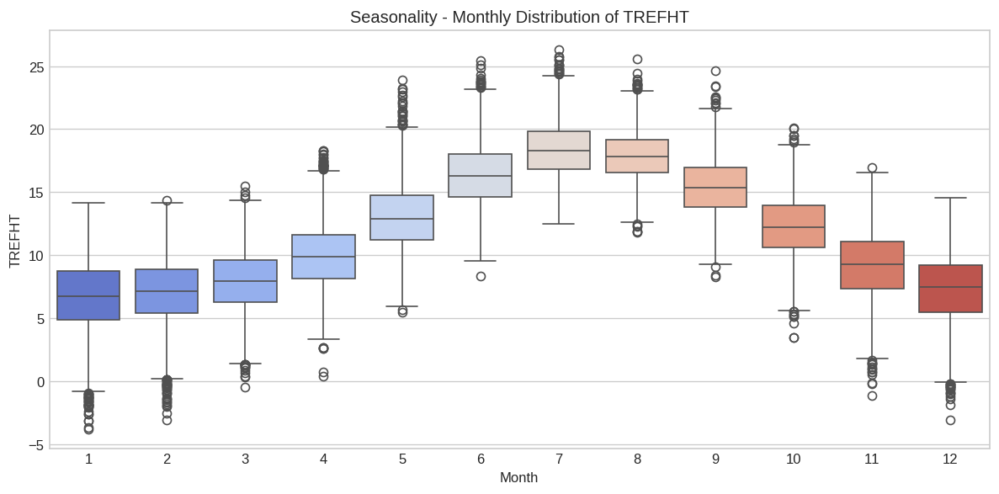

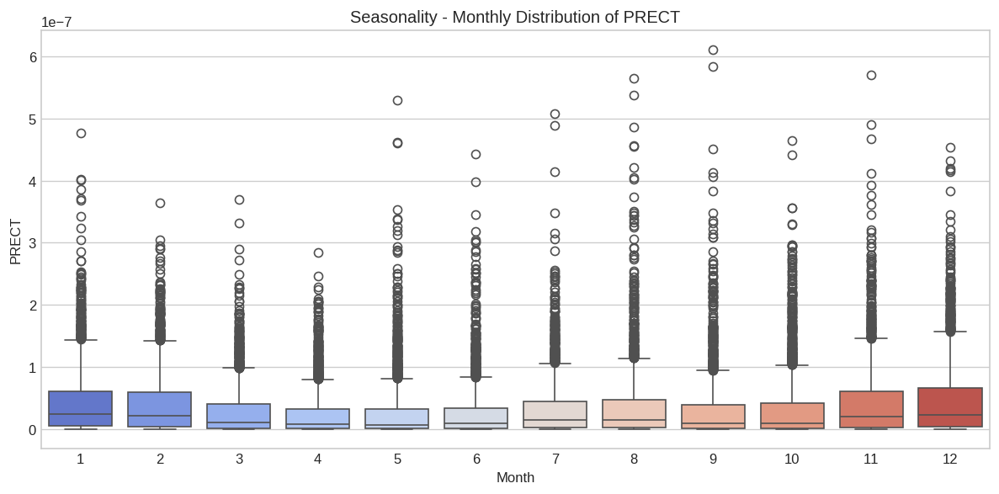

In [26]:
# ────────────────────────────────────────────────
# 5. Seasonality – Monthly boxplots
# ────────────────────────────────────────────────
for var in ['TREFMXAV_U', 'TREFHT', 'PRECT']:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x='month', y=var, data=df, palette='coolwarm')
    plt.title(f'Seasonality - Monthly Distribution of {var}')
    plt.xlabel('Month')
    plt.tight_layout()
    plt.savefig(f'seasonality_monthly_{var.lower()}.png', bbox_inches='tight')
    plt.show()

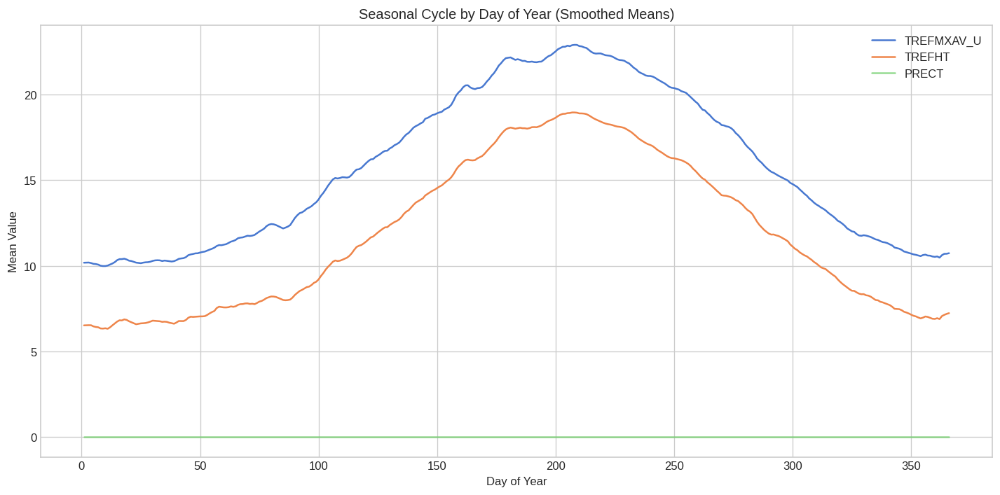

In [27]:
# ────────────────────────────────────────────────
# 6. Smoothed seasonal cycle by day of year
# ────────────────────────────────────────────────
doy_mean = df.groupby('dayofyear')[['TREFMXAV_U', 'TREFHT', 'PRECT']].mean()
# 7-day rolling mean for smoother curve
doy_smooth = doy_mean.rolling(window=7, center=True, min_periods=1).mean()

plt.figure(figsize=(12, 6))
plt.plot(doy_smooth.index, doy_smooth['TREFMXAV_U'], label='TREFMXAV_U')
plt.plot(doy_smooth.index, doy_smooth['TREFHT'],    label='TREFHT')
plt.plot(doy_smooth.index, doy_smooth['PRECT'],     label='PRECT', alpha=0.7)
plt.title('Seasonal Cycle by Day of Year (Smoothed Means)')
plt.xlabel('Day of Year')
plt.ylabel('Mean Value')
plt.legend()
plt.tight_layout()
plt.savefig('seasonal_cycle_dayofyear.png', bbox_inches='tight')
plt.show()

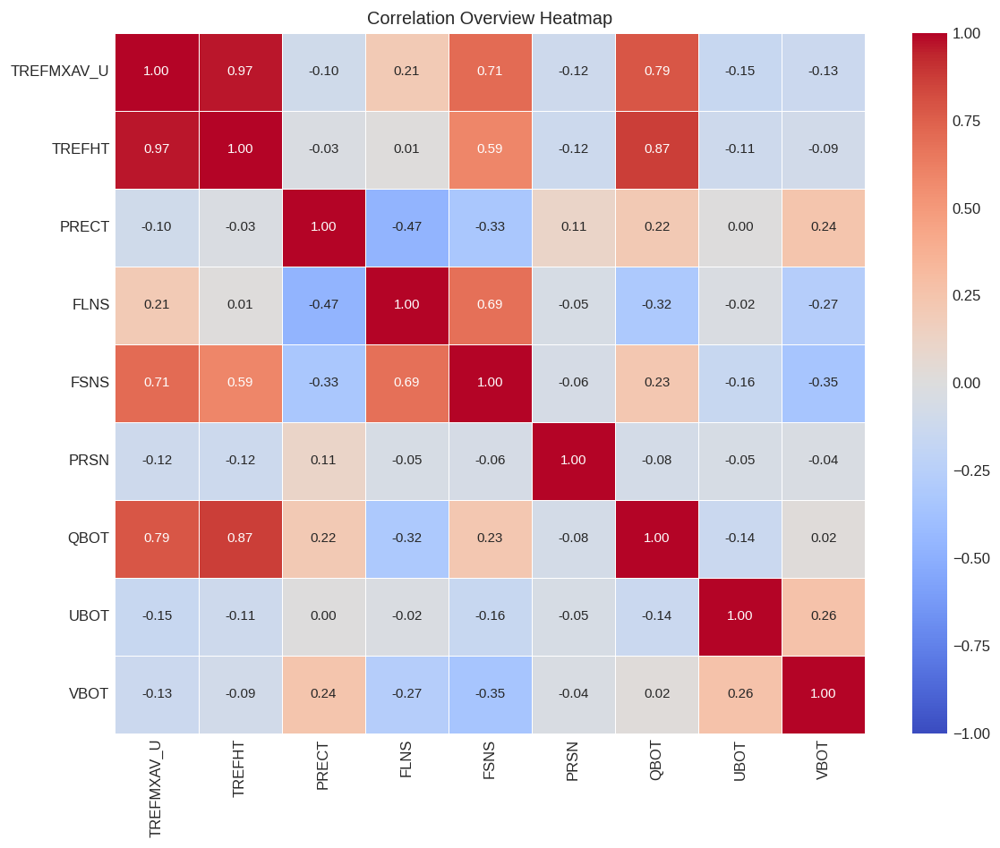

In [28]:
# ────────────────────────────────────────────────
# 7. Correlation heatmap
# ────────────────────────────────────────────────
corr = df[KEY_VARS].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1,
            linewidths=0.5, annot_kws={'size': 9})
plt.title('Correlation Overview Heatmap')
plt.tight_layout()
plt.savefig('correlation_heatmap.png', bbox_inches='tight')
plt.show()

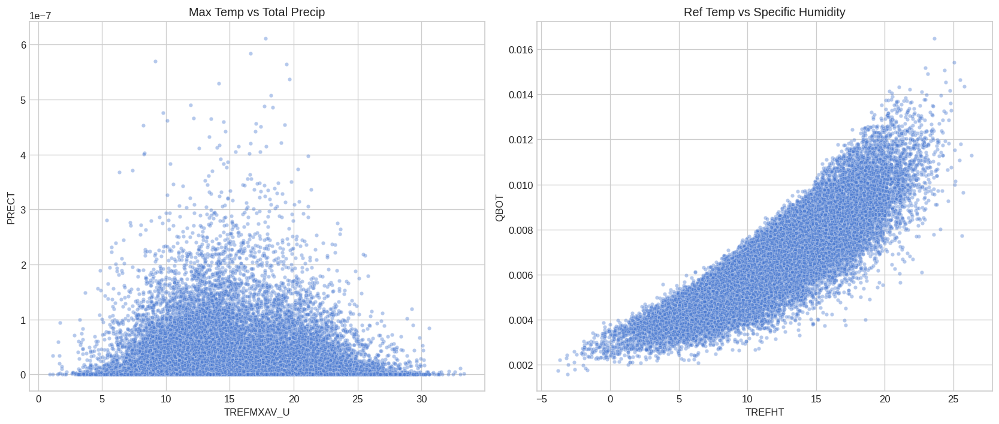

In [29]:
# ────────────────────────────────────────────────
# 8. Example multivariate scatter plots
# ────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.scatterplot(x='TREFMXAV_U', y='PRECT', data=df, ax=axes[0], alpha=0.4, s=15)
axes[0].set_title('Max Temp vs Total Precip')
axes[0].set_xlabel('TREFMXAV_U')
axes[0].set_ylabel('PRECT')

sns.scatterplot(x='TREFHT', y='QBOT', data=df, ax=axes[1], alpha=0.4, s=15)
axes[1].set_title('Ref Temp vs Specific Humidity')
axes[1].set_xlabel('TREFHT')
axes[1].set_ylabel('QBOT')

plt.tight_layout()
plt.savefig('multivariate_scatter_examples.png', bbox_inches='tight')
plt.show()

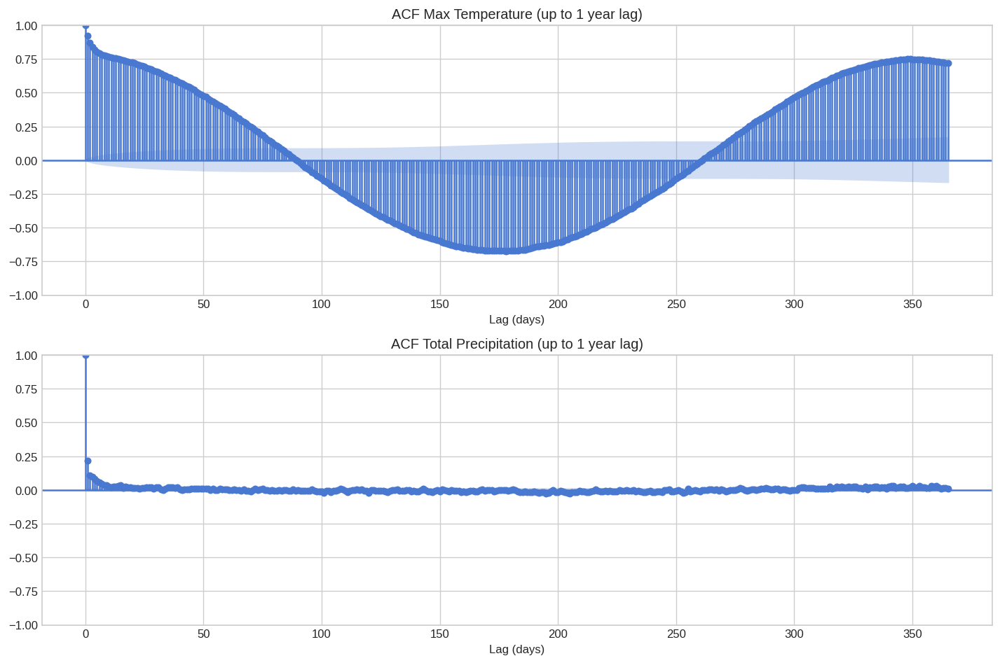

In [30]:
# ────────────────────────────────────────────────
# 9. ACF (lag analysis) – up to 365 days
# ────────────────────────────────────────────────
fig, axes = plt.subplots(2, 1, figsize=(12, 8))

plot_acf(df['TREFMXAV_U'], lags=365, ax=axes[0], title='ACF Max Temperature (up to 1 year lag)')
axes[0].set_xlabel('Lag (days)')

plot_acf(df['PRECT'], lags=365, ax=axes[1], title='ACF Total Precipitation (up to 1 year lag)')
axes[1].set_xlabel('Lag (days)')

plt.tight_layout()
plt.savefig('lag_analysis_acf.png', bbox_inches='tight')
plt.show()

Dataset 006

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
import warnings

warnings.filterwarnings('ignore')

# ────────────────────────────────────────────────
#  SETTINGS
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("muted")
plt.rcParams['figure.dpi'] = 120
plt.rcParams['savefig.dpi'] = 150
plt.rcParams['figure.figsize'] = (10, 5)

FILE_PATH = "006_manchester_processed.csv"   # ← change if needed

# Key variables to focus on
KEY_VARS = ['TREFMXAV_U', 'TREFHT', 'PRECT', 'FLNS', 'FSNS', 'PRSN', 'QBOT', 'UBOT', 'VBOT']

In [32]:
# ────────────────────────────────────────────────
# 1. Load & Prepare
# ────────────────────────────────────────────────
df = pd.read_csv(FILE_PATH, parse_dates=['time'])
df['year'] = df['time'].dt.year
df['month'] = df['time'].dt.month
df['dayofyear'] = df['time'].dt.dayofyear

print("Shape:", df.shape)
print("Date range:", df['time'].min(), "–", df['time'].max())
print("Missing values:\n", df.isna().sum())

Shape: (26346, 16)
Date range: 2006-01-02 00:00:00 – 2080-12-31 00:00:00
Missing values:
 time          0
TREFMXAV_U    0
FLNS          0
FSNS          0
PRECT         0
PRSN          0
QBOT          0
TREFHT        0
UBOT          0
VBOT          0
lat           0
lon           0
year          0
month         0
day           0
dayofyear     0
dtype: int64


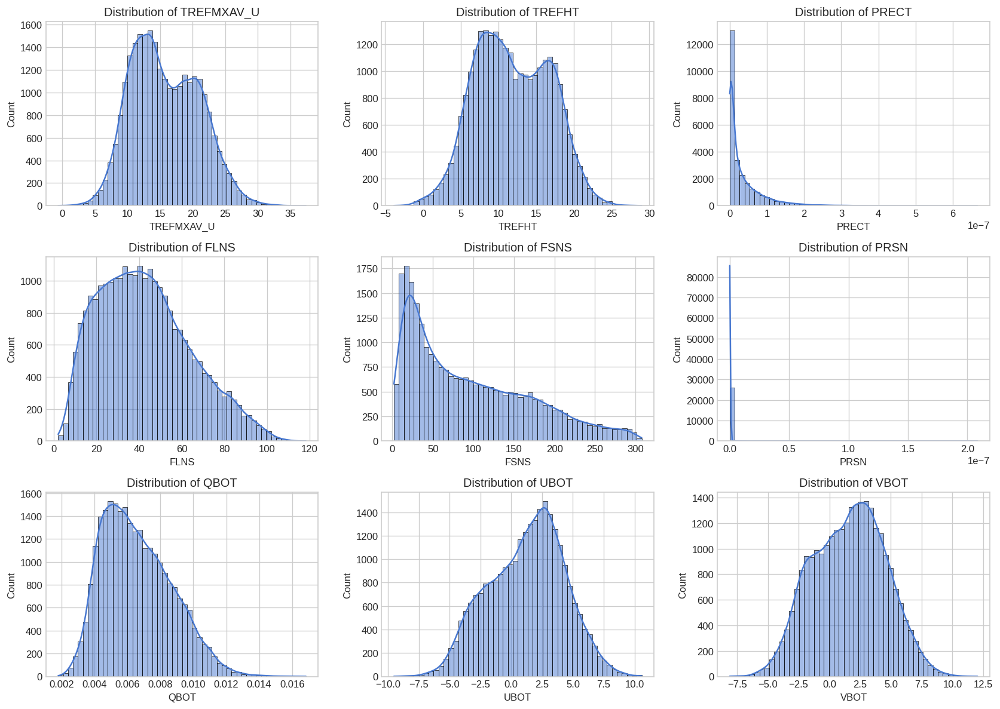

In [33]:
# ────────────────────────────────────────────────
# 2. Distributions – Histograms
# ────────────────────────────────────────────────
fig, axes = plt.subplots(3, 3, figsize=(14, 10))
axes = axes.ravel()

for i, var in enumerate(KEY_VARS):
    sns.histplot(data=df, x=var, ax=axes[i], kde=True, bins=50)
    axes[i].set_title(f'Distribution of {var}')

plt.tight_layout()
plt.savefig('distributions_key_vars.png', bbox_inches='tight')
plt.show()

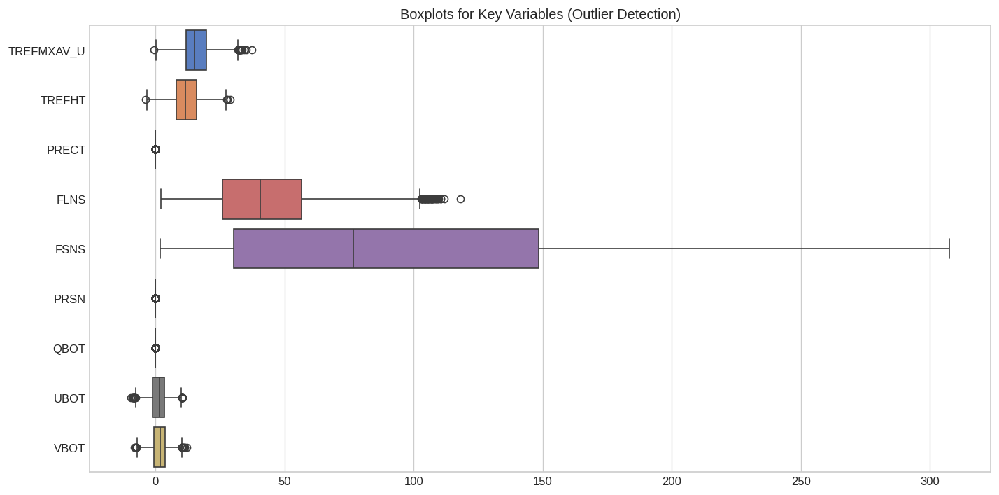

In [34]:
# ────────────────────────────────────────────────
# 3. Boxplots (outlier overview)
# ────────────────────────────────────────────────
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[KEY_VARS], orient='h', whis=1.5)
plt.title('Boxplots for Key Variables (Outlier Detection)')
plt.tight_layout()
plt.savefig('boxplots_key_vars.png', bbox_inches='tight')
plt.show()

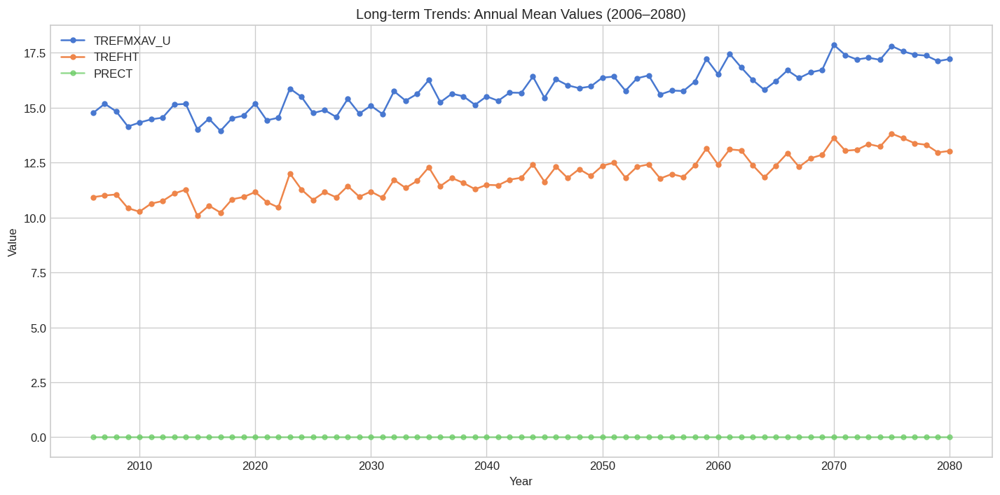

In [35]:
# ────────────────────────────────────────────────
# 4. Long-term trend – Annual means
# ────────────────────────────────────────────────
annual = df.groupby('year')[['TREFMXAV_U', 'TREFHT', 'PRECT']].mean().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(annual['year'], annual['TREFMXAV_U'], label='TREFMXAV_U', marker='o', ms=4)
plt.plot(annual['year'], annual['TREFHT'],    label='TREFHT',    marker='o', ms=4)
plt.plot(annual['year'], annual['PRECT'],     label='PRECT',     marker='o', ms=4, alpha=0.7)
plt.title('Long-term Trends: Annual Mean Values (2006–2080)')
plt.xlabel('Year')
plt.ylabel('Value')
plt.legend()
plt.tight_layout()
plt.savefig('long_term_annual_trends.png', bbox_inches='tight')
plt.show()

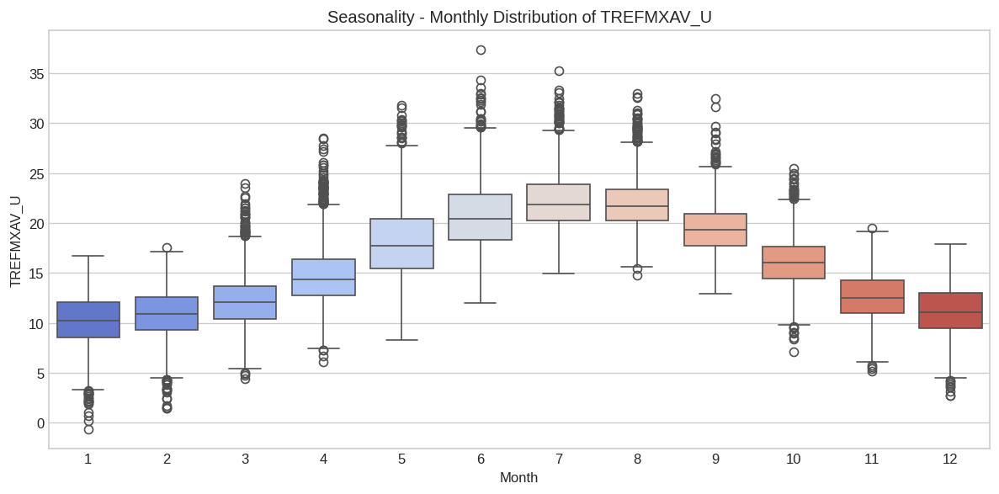

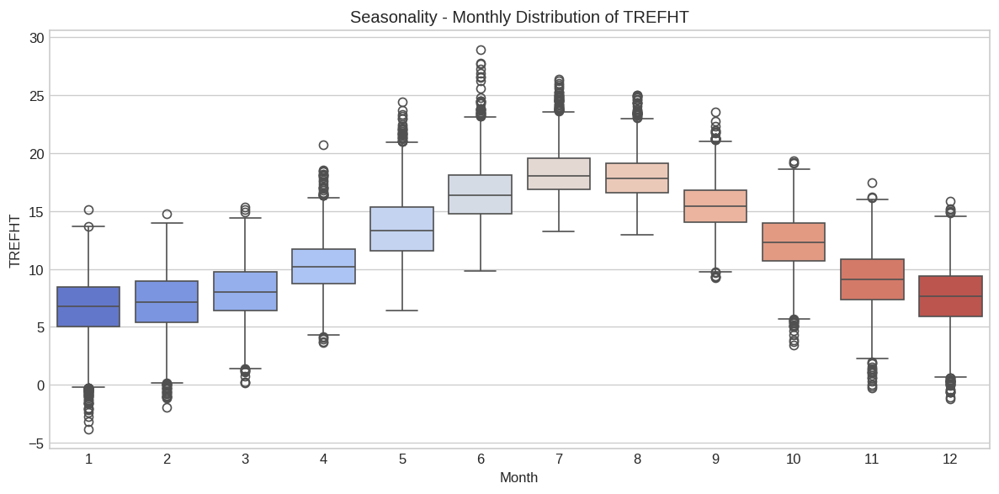

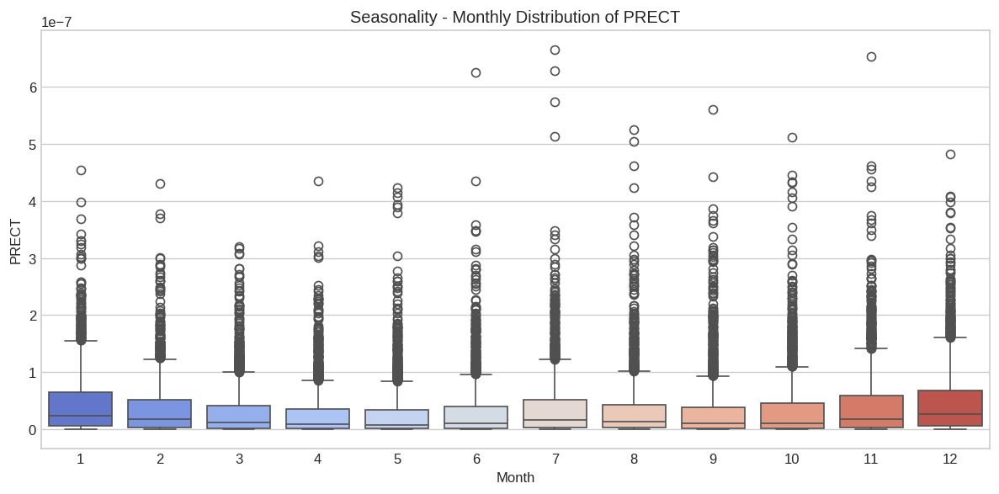

In [36]:
# ────────────────────────────────────────────────
# 5. Seasonality – Monthly boxplots
# ────────────────────────────────────────────────
for var in ['TREFMXAV_U', 'TREFHT', 'PRECT']:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x='month', y=var, data=df, palette='coolwarm')
    plt.title(f'Seasonality - Monthly Distribution of {var}')
    plt.xlabel('Month')
    plt.tight_layout()
    plt.savefig(f'seasonality_monthly_{var.lower()}.png', bbox_inches='tight')
    plt.show()

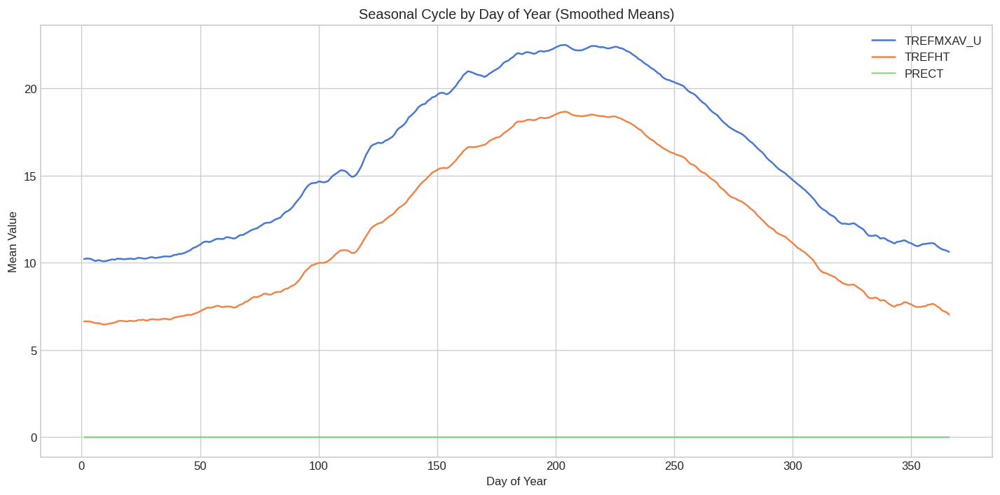

In [37]:
# ────────────────────────────────────────────────
# 6. Smoothed seasonal cycle by day of year
# ────────────────────────────────────────────────
doy_mean = df.groupby('dayofyear')[['TREFMXAV_U', 'TREFHT', 'PRECT']].mean()
# 7-day rolling mean for smoother curve
doy_smooth = doy_mean.rolling(window=7, center=True, min_periods=1).mean()

plt.figure(figsize=(12, 6))
plt.plot(doy_smooth.index, doy_smooth['TREFMXAV_U'], label='TREFMXAV_U')
plt.plot(doy_smooth.index, doy_smooth['TREFHT'],    label='TREFHT')
plt.plot(doy_smooth.index, doy_smooth['PRECT'],     label='PRECT', alpha=0.7)
plt.title('Seasonal Cycle by Day of Year (Smoothed Means)')
plt.xlabel('Day of Year')
plt.ylabel('Mean Value')
plt.legend()
plt.tight_layout()
plt.savefig('seasonal_cycle_dayofyear.png', bbox_inches='tight')
plt.show()

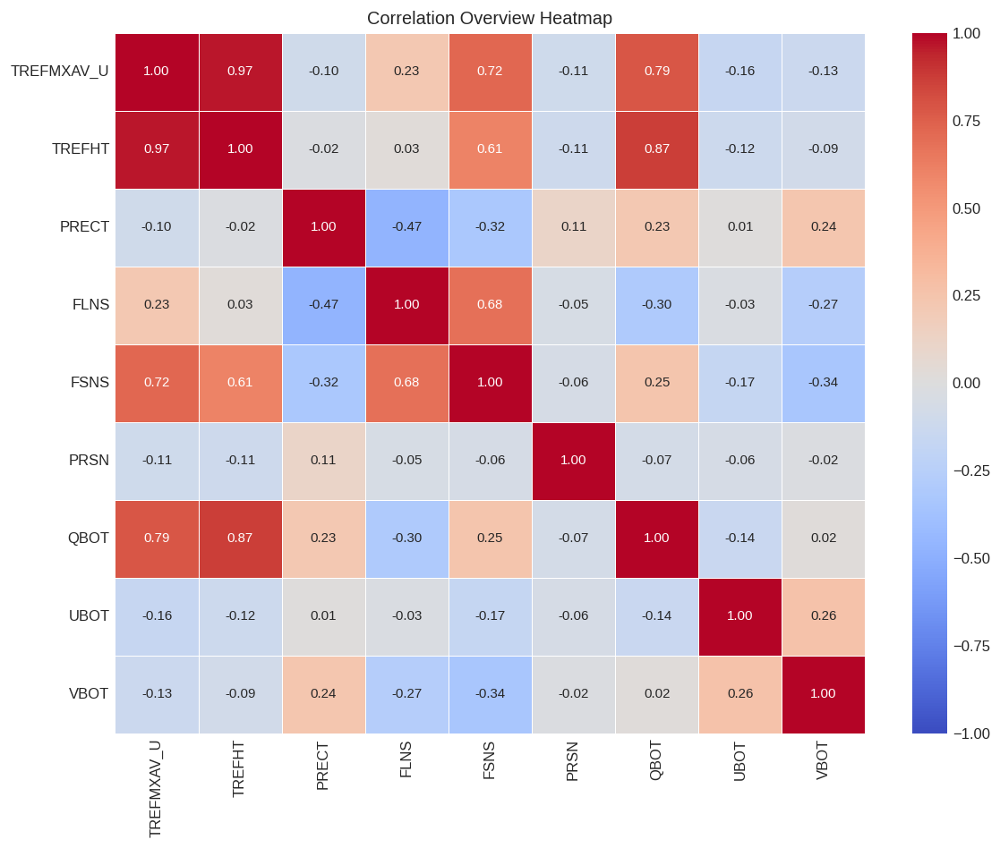

In [38]:
# ────────────────────────────────────────────────
# 7. Correlation heatmap
# ────────────────────────────────────────────────
corr = df[KEY_VARS].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1,
            linewidths=0.5, annot_kws={'size': 9})
plt.title('Correlation Overview Heatmap')
plt.tight_layout()
plt.savefig('correlation_heatmap.png', bbox_inches='tight')
plt.show()

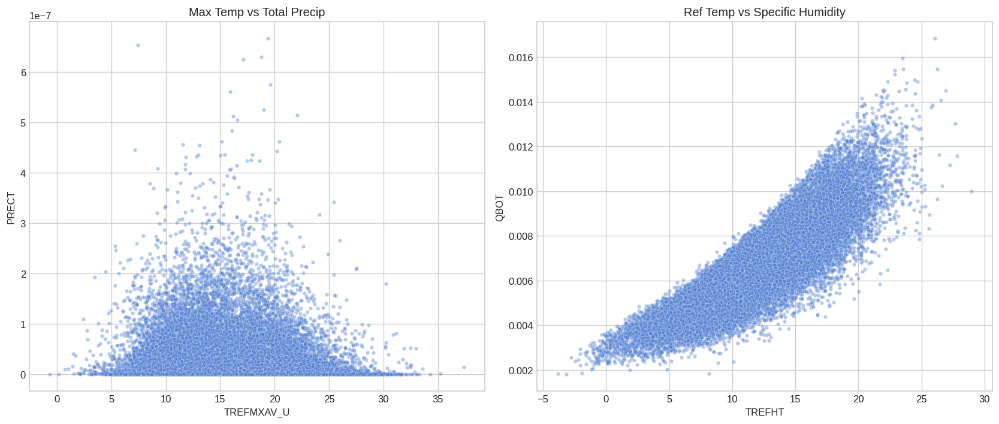

In [39]:
# ────────────────────────────────────────────────
# 8. Example multivariate scatter plots
# ────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.scatterplot(x='TREFMXAV_U', y='PRECT', data=df, ax=axes[0], alpha=0.4, s=15)
axes[0].set_title('Max Temp vs Total Precip')
axes[0].set_xlabel('TREFMXAV_U')
axes[0].set_ylabel('PRECT')

sns.scatterplot(x='TREFHT', y='QBOT', data=df, ax=axes[1], alpha=0.4, s=15)
axes[1].set_title('Ref Temp vs Specific Humidity')
axes[1].set_xlabel('TREFHT')
axes[1].set_ylabel('QBOT')

plt.tight_layout()
plt.savefig('multivariate_scatter_examples.png', bbox_inches='tight')
plt.show()

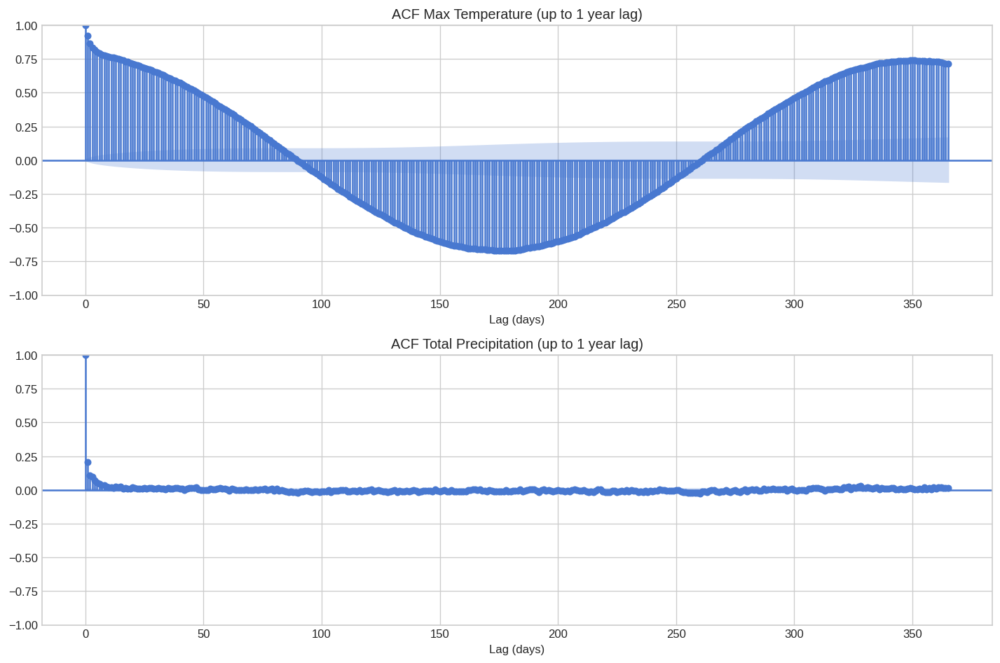

In [40]:
# ────────────────────────────────────────────────
# 9. ACF (lag analysis) – up to 365 days
# ────────────────────────────────────────────────
fig, axes = plt.subplots(2, 1, figsize=(12, 8))

plot_acf(df['TREFMXAV_U'], lags=365, ax=axes[0], title='ACF Max Temperature (up to 1 year lag)')
axes[0].set_xlabel('Lag (days)')

plot_acf(df['PRECT'], lags=365, ax=axes[1], title='ACF Total Precipitation (up to 1 year lag)')
axes[1].set_xlabel('Lag (days)')

plt.tight_layout()
plt.savefig('lag_analysis_acf.png', bbox_inches='tight')
plt.show()

Dataset 007

In [42]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
import warnings

warnings.filterwarnings('ignore')

# ────────────────────────────────────────────────
#  SETTINGS
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("muted")
plt.rcParams['figure.dpi'] = 120
plt.rcParams['savefig.dpi'] = 150
plt.rcParams['figure.figsize'] = (10, 5)

FILE_PATH = "007_manchester_processed.csv"   # ← change if needed

# Key variables to focus on
KEY_VARS = ['TREFMXAV_U', 'TREFHT', 'PRECT', 'FLNS', 'FSNS', 'PRSN', 'QBOT', 'UBOT', 'VBOT']

In [43]:
# ────────────────────────────────────────────────
# 1. Load & Prepare
# ────────────────────────────────────────────────
df = pd.read_csv(FILE_PATH, parse_dates=['time'])
df['year'] = df['time'].dt.year
df['month'] = df['time'].dt.month
df['dayofyear'] = df['time'].dt.dayofyear

print("Shape:", df.shape)
print("Date range:", df['time'].min(), "–", df['time'].max())
print("Missing values:\n", df.isna().sum())

Shape: (26307, 16)
Date range: 2006-01-02 00:00:00 – 2080-12-31 00:00:00
Missing values:
 time          0
TREFMXAV_U    0
FLNS          0
FSNS          0
PRECT         0
PRSN          0
QBOT          0
TREFHT        0
UBOT          0
VBOT          0
lat           0
lon           0
year          0
month         0
day           0
dayofyear     0
dtype: int64


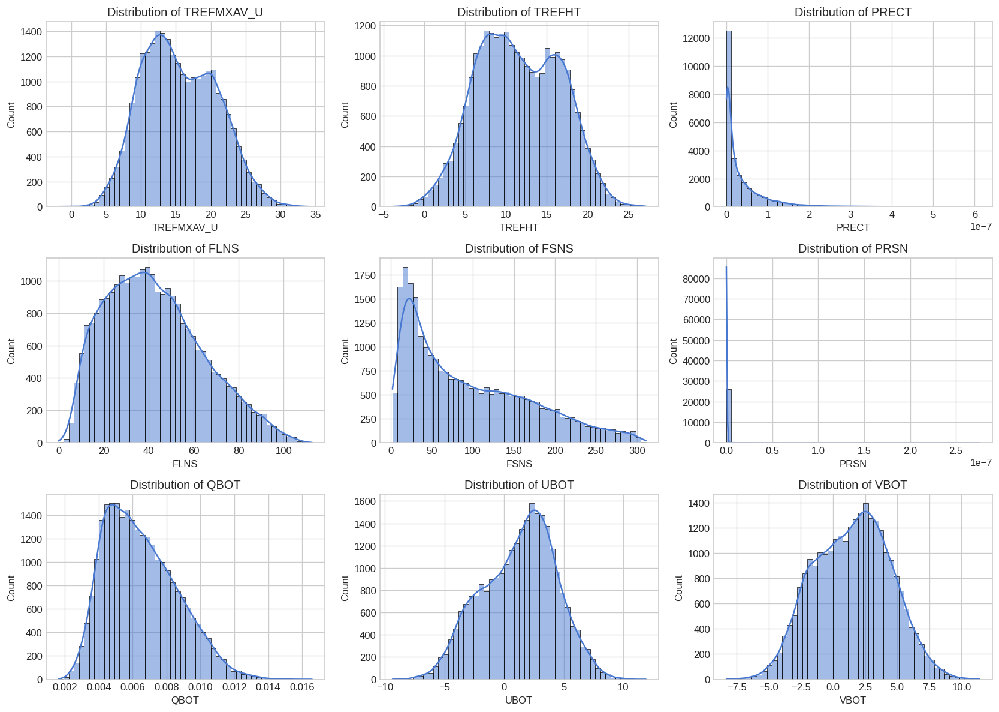

In [44]:
# ────────────────────────────────────────────────
# 2. Distributions – Histograms
# ────────────────────────────────────────────────
fig, axes = plt.subplots(3, 3, figsize=(14, 10))
axes = axes.ravel()

for i, var in enumerate(KEY_VARS):
    sns.histplot(data=df, x=var, ax=axes[i], kde=True, bins=50)
    axes[i].set_title(f'Distribution of {var}')

plt.tight_layout()
plt.savefig('distributions_key_vars.png', bbox_inches='tight')
plt.show()

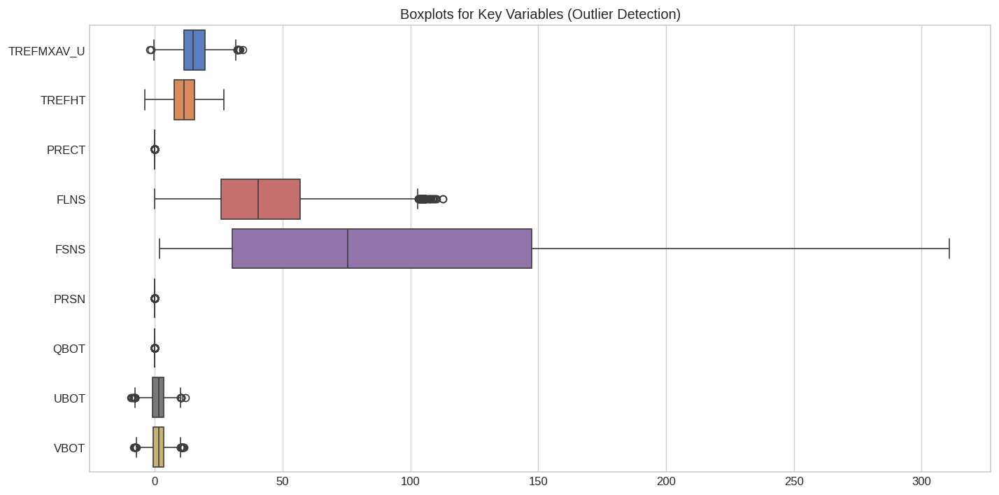

In [45]:
# ────────────────────────────────────────────────
# 3. Boxplots (outlier overview)
# ────────────────────────────────────────────────
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[KEY_VARS], orient='h', whis=1.5)
plt.title('Boxplots for Key Variables (Outlier Detection)')
plt.tight_layout()
plt.savefig('boxplots_key_vars.png', bbox_inches='tight')
plt.show()

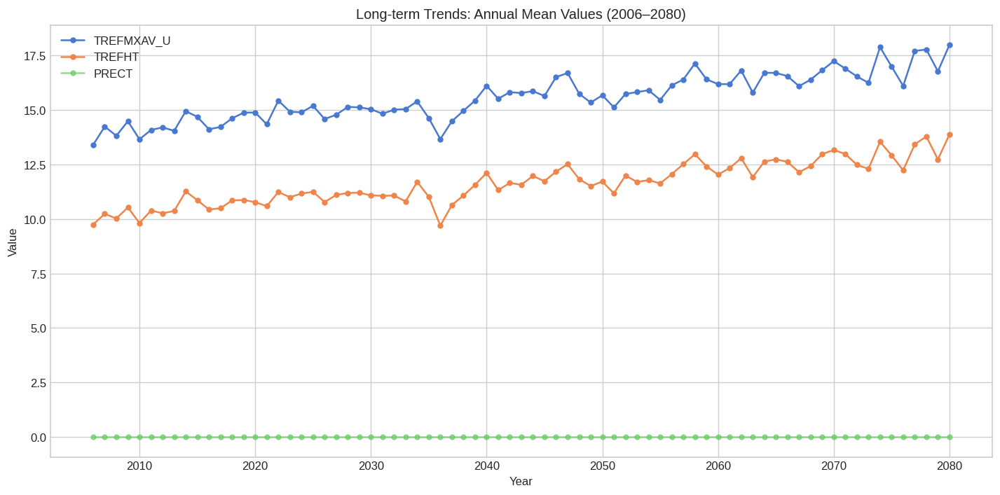

In [46]:
# ────────────────────────────────────────────────
# 4. Long-term trend – Annual means
# ────────────────────────────────────────────────
annual = df.groupby('year')[['TREFMXAV_U', 'TREFHT', 'PRECT']].mean().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(annual['year'], annual['TREFMXAV_U'], label='TREFMXAV_U', marker='o', ms=4)
plt.plot(annual['year'], annual['TREFHT'],    label='TREFHT',    marker='o', ms=4)
plt.plot(annual['year'], annual['PRECT'],     label='PRECT',     marker='o', ms=4, alpha=0.7)
plt.title('Long-term Trends: Annual Mean Values (2006–2080)')
plt.xlabel('Year')
plt.ylabel('Value')
plt.legend()
plt.tight_layout()
plt.savefig('long_term_annual_trends.png', bbox_inches='tight')
plt.show()

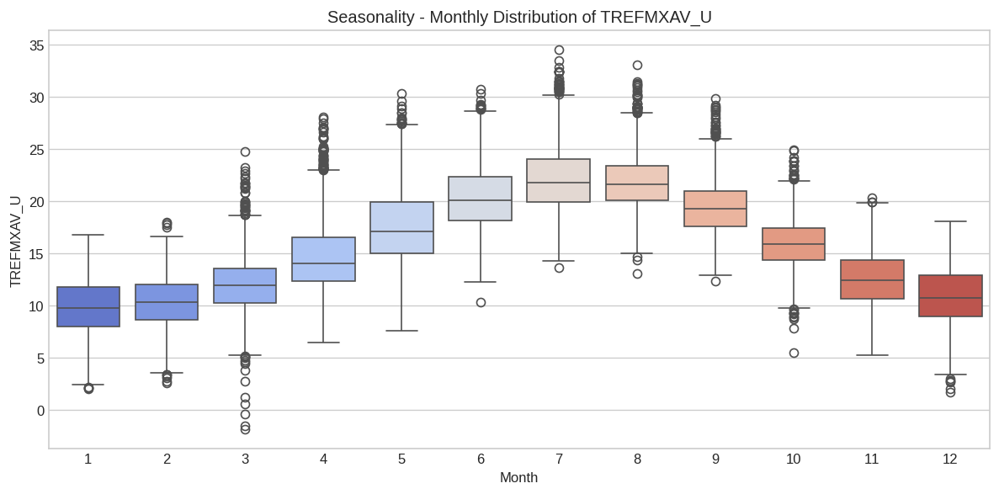

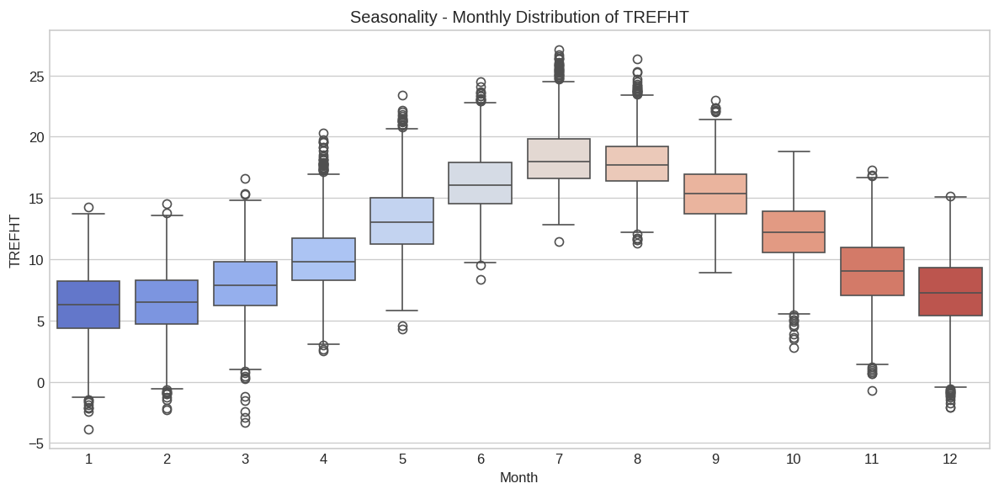

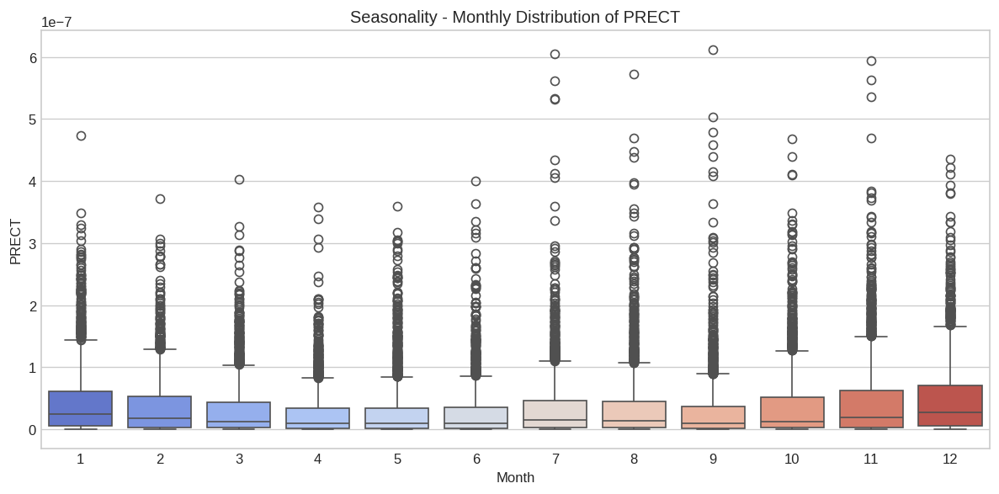

In [47]:
# ────────────────────────────────────────────────
# 5. Seasonality – Monthly boxplots
# ────────────────────────────────────────────────
for var in ['TREFMXAV_U', 'TREFHT', 'PRECT']:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x='month', y=var, data=df, palette='coolwarm')
    plt.title(f'Seasonality - Monthly Distribution of {var}')
    plt.xlabel('Month')
    plt.tight_layout()
    plt.savefig(f'seasonality_monthly_{var.lower()}.png', bbox_inches='tight')
    plt.show()

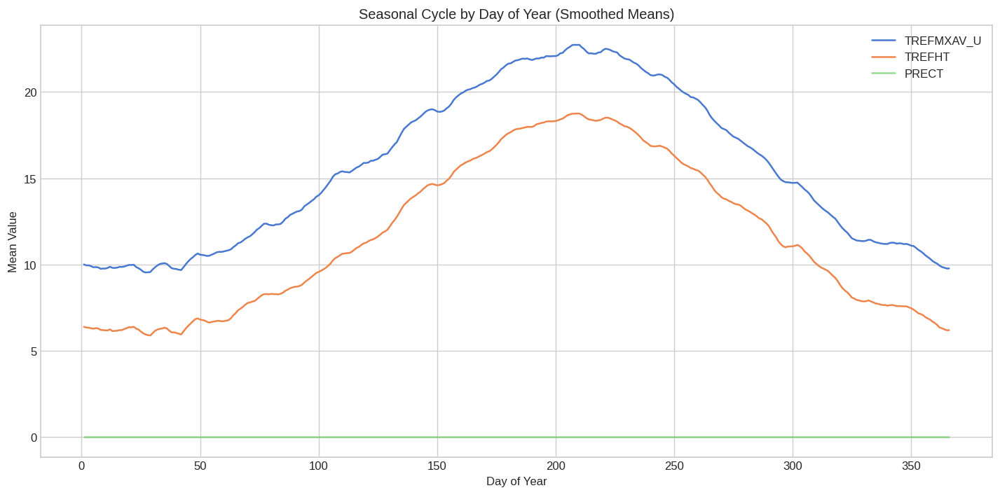

In [48]:
# ────────────────────────────────────────────────
# 6. Smoothed seasonal cycle by day of year
# ────────────────────────────────────────────────
doy_mean = df.groupby('dayofyear')[['TREFMXAV_U', 'TREFHT', 'PRECT']].mean()
# 7-day rolling mean for smoother curve
doy_smooth = doy_mean.rolling(window=7, center=True, min_periods=1).mean()

plt.figure(figsize=(12, 6))
plt.plot(doy_smooth.index, doy_smooth['TREFMXAV_U'], label='TREFMXAV_U')
plt.plot(doy_smooth.index, doy_smooth['TREFHT'],    label='TREFHT')
plt.plot(doy_smooth.index, doy_smooth['PRECT'],     label='PRECT', alpha=0.7)
plt.title('Seasonal Cycle by Day of Year (Smoothed Means)')
plt.xlabel('Day of Year')
plt.ylabel('Mean Value')
plt.legend()
plt.tight_layout()
plt.savefig('seasonal_cycle_dayofyear.png', bbox_inches='tight')
plt.show()

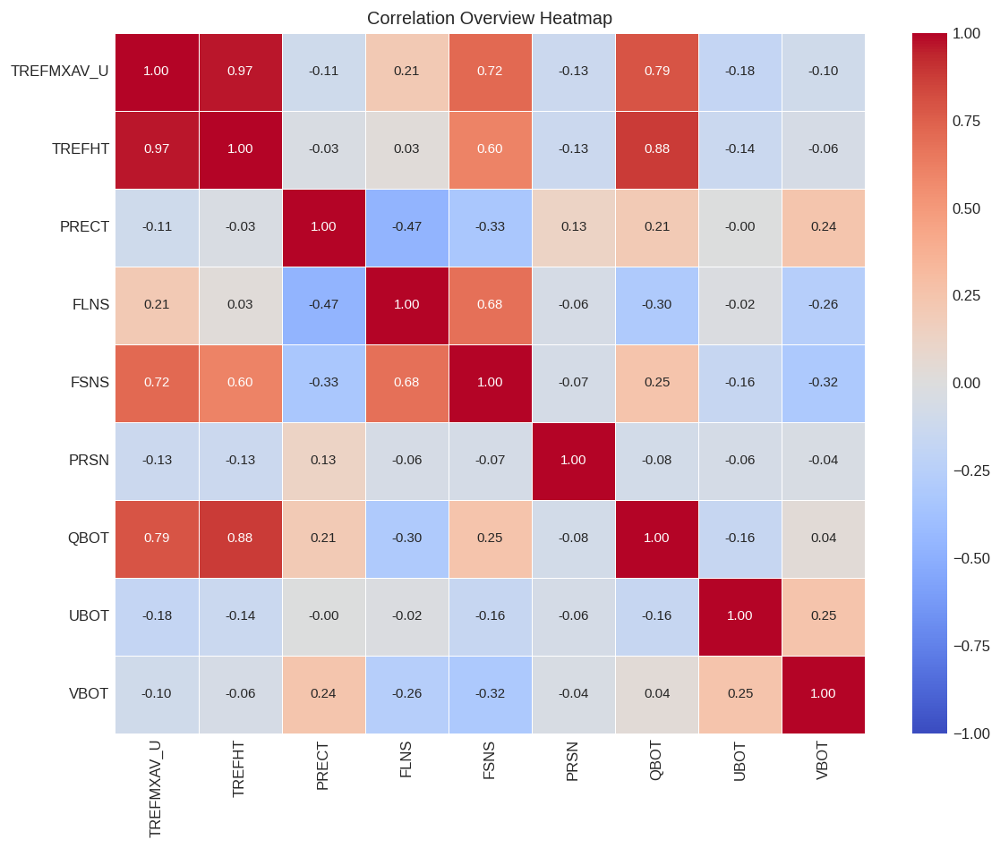

In [49]:
# ────────────────────────────────────────────────
# 7. Correlation heatmap
# ────────────────────────────────────────────────
corr = df[KEY_VARS].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1,
            linewidths=0.5, annot_kws={'size': 9})
plt.title('Correlation Overview Heatmap')
plt.tight_layout()
plt.savefig('correlation_heatmap.png', bbox_inches='tight')
plt.show()

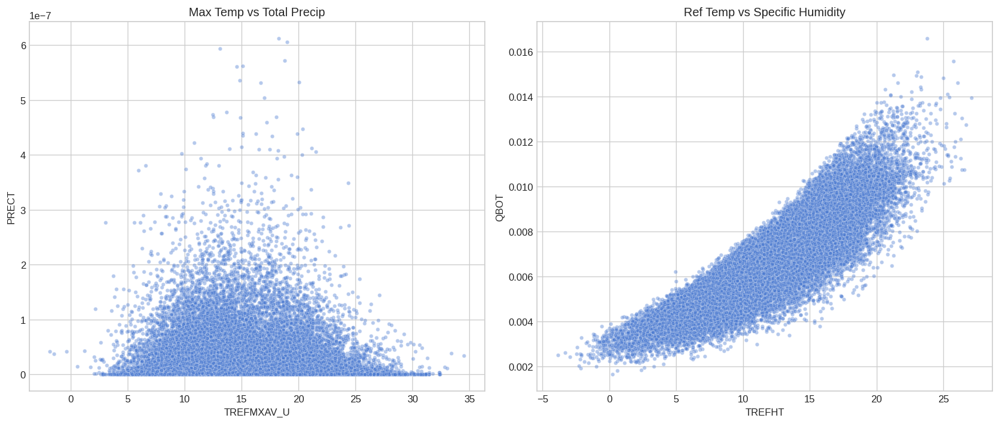

In [50]:
# ────────────────────────────────────────────────
# 8. Example multivariate scatter plots
# ────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.scatterplot(x='TREFMXAV_U', y='PRECT', data=df, ax=axes[0], alpha=0.4, s=15)
axes[0].set_title('Max Temp vs Total Precip')
axes[0].set_xlabel('TREFMXAV_U')
axes[0].set_ylabel('PRECT')

sns.scatterplot(x='TREFHT', y='QBOT', data=df, ax=axes[1], alpha=0.4, s=15)
axes[1].set_title('Ref Temp vs Specific Humidity')
axes[1].set_xlabel('TREFHT')
axes[1].set_ylabel('QBOT')

plt.tight_layout()
plt.savefig('multivariate_scatter_examples.png', bbox_inches='tight')
plt.show()

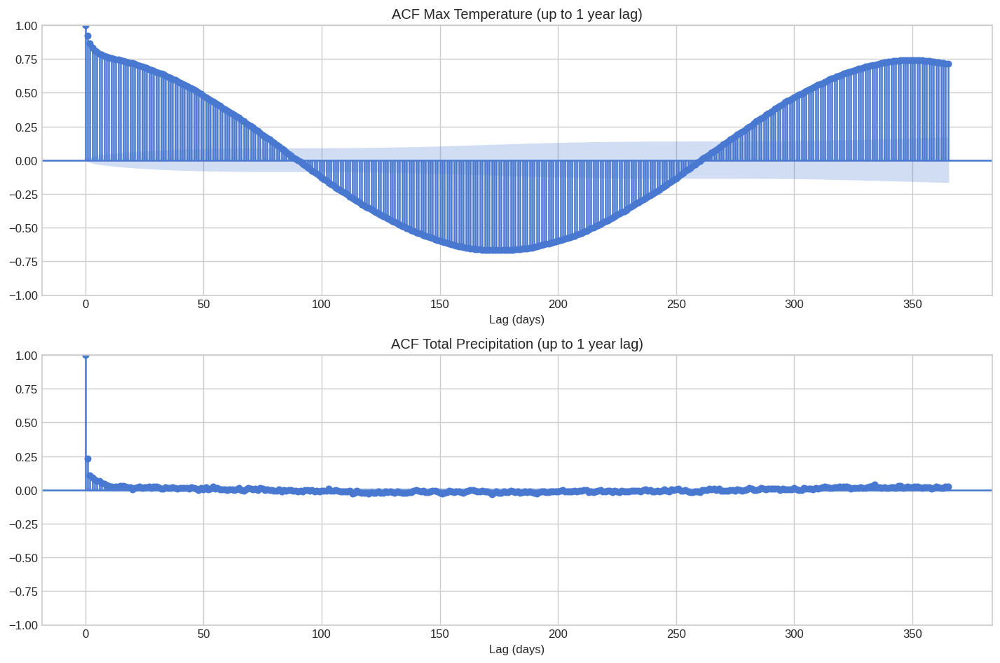

In [51]:
# ────────────────────────────────────────────────
# 9. ACF (lag analysis) – up to 365 days
# ────────────────────────────────────────────────
fig, axes = plt.subplots(2, 1, figsize=(12, 8))

plot_acf(df['TREFMXAV_U'], lags=365, ax=axes[0], title='ACF Max Temperature (up to 1 year lag)')
axes[0].set_xlabel('Lag (days)')

plot_acf(df['PRECT'], lags=365, ax=axes[1], title='ACF Total Precipitation (up to 1 year lag)')
axes[1].set_xlabel('Lag (days)')

plt.tight_layout()
plt.savefig('lag_analysis_acf.png', bbox_inches='tight')
plt.show()

Dataset 008

In [52]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
import warnings

warnings.filterwarnings('ignore')

# ────────────────────────────────────────────────
#  SETTINGS
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("muted")
plt.rcParams['figure.dpi'] = 120
plt.rcParams['savefig.dpi'] = 150
plt.rcParams['figure.figsize'] = (10, 5)

FILE_PATH = "008_manchester_processed.csv"   # ← change if needed

# Key variables to focus on
KEY_VARS = ['TREFMXAV_U', 'TREFHT', 'PRECT', 'FLNS', 'FSNS', 'PRSN', 'QBOT', 'UBOT', 'VBOT']

In [53]:
# ────────────────────────────────────────────────
# 1. Load & Prepare
# ────────────────────────────────────────────────
df = pd.read_csv(FILE_PATH, parse_dates=['time'])
df['year'] = df['time'].dt.year
df['month'] = df['time'].dt.month
df['dayofyear'] = df['time'].dt.dayofyear

print("Shape:", df.shape)
print("Date range:", df['time'].min(), "–", df['time'].max())
print("Missing values:\n", df.isna().sum())

Shape: (26312, 16)
Date range: 2006-01-02 00:00:00 – 2080-12-31 00:00:00
Missing values:
 time          0
TREFMXAV_U    0
FLNS          0
FSNS          0
PRECT         0
PRSN          0
QBOT          0
TREFHT        0
UBOT          0
VBOT          0
lat           0
lon           0
year          0
month         0
day           0
dayofyear     0
dtype: int64


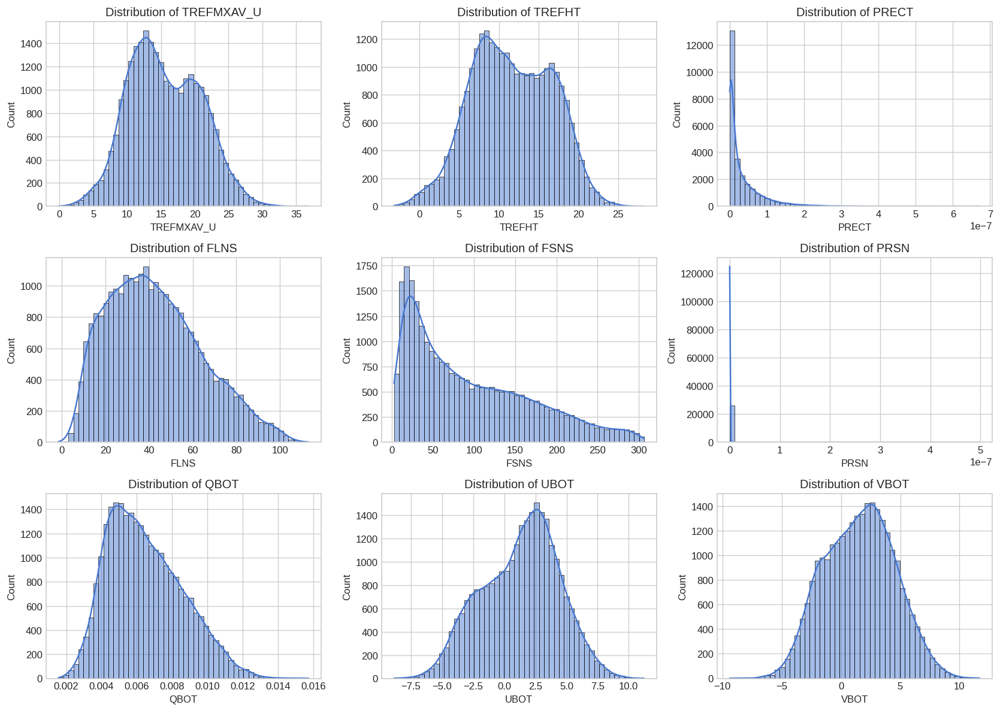

In [54]:
# ────────────────────────────────────────────────
# 2. Distributions – Histograms
# ────────────────────────────────────────────────
fig, axes = plt.subplots(3, 3, figsize=(14, 10))
axes = axes.ravel()

for i, var in enumerate(KEY_VARS):
    sns.histplot(data=df, x=var, ax=axes[i], kde=True, bins=50)
    axes[i].set_title(f'Distribution of {var}')

plt.tight_layout()
plt.savefig('distributions_key_vars.png', bbox_inches='tight')
plt.show()

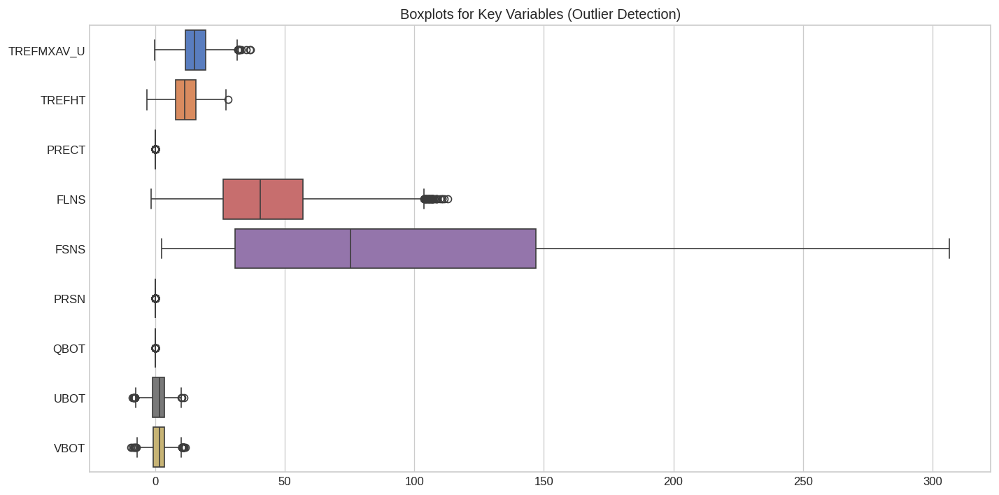

In [55]:
# ────────────────────────────────────────────────
# 3. Boxplots (outlier overview)
# ────────────────────────────────────────────────
plt.figure(figsize=(12, 6))
sns.boxplot(data=df[KEY_VARS], orient='h', whis=1.5)
plt.title('Boxplots for Key Variables (Outlier Detection)')
plt.tight_layout()
plt.savefig('boxplots_key_vars.png', bbox_inches='tight')
plt.show()

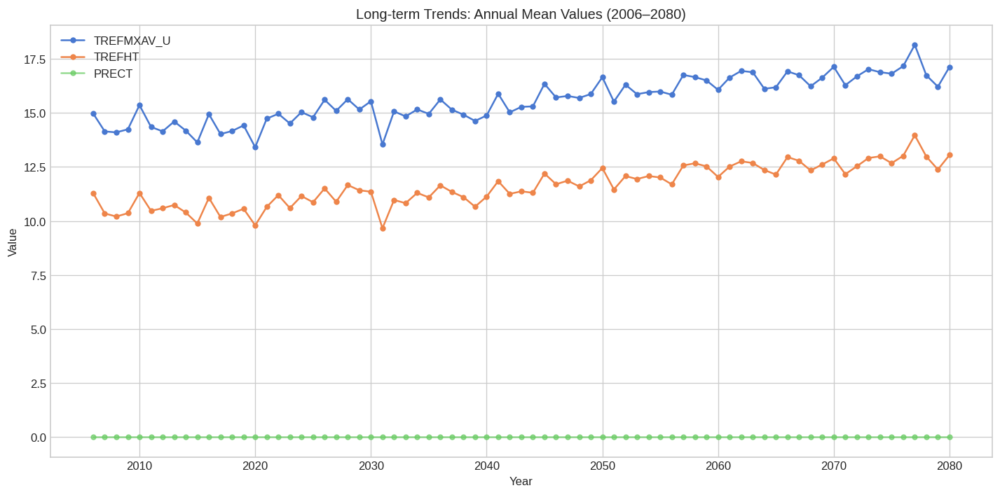

In [56]:
# ────────────────────────────────────────────────
# 4. Long-term trend – Annual means
# ────────────────────────────────────────────────
annual = df.groupby('year')[['TREFMXAV_U', 'TREFHT', 'PRECT']].mean().reset_index()

plt.figure(figsize=(12, 6))
plt.plot(annual['year'], annual['TREFMXAV_U'], label='TREFMXAV_U', marker='o', ms=4)
plt.plot(annual['year'], annual['TREFHT'],    label='TREFHT',    marker='o', ms=4)
plt.plot(annual['year'], annual['PRECT'],     label='PRECT',     marker='o', ms=4, alpha=0.7)
plt.title('Long-term Trends: Annual Mean Values (2006–2080)')
plt.xlabel('Year')
plt.ylabel('Value')
plt.legend()
plt.tight_layout()
plt.savefig('long_term_annual_trends.png', bbox_inches='tight')
plt.show()

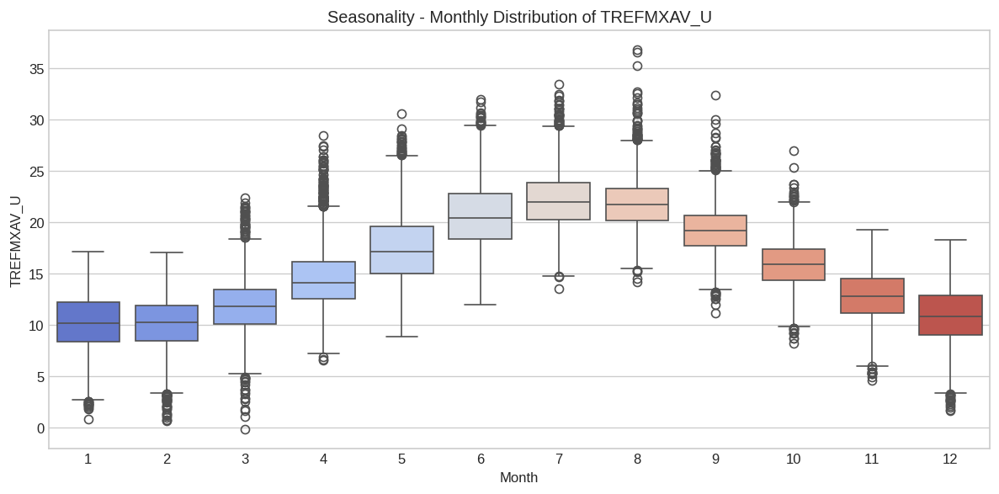

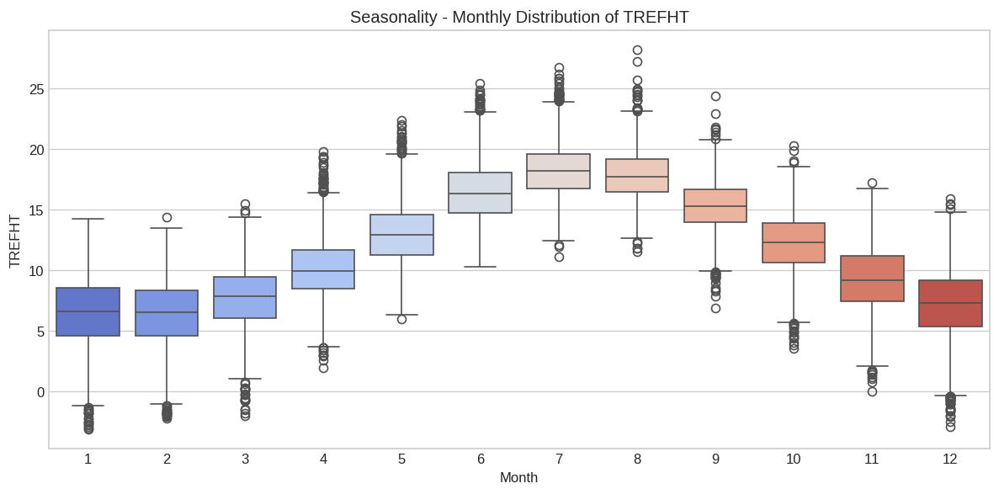

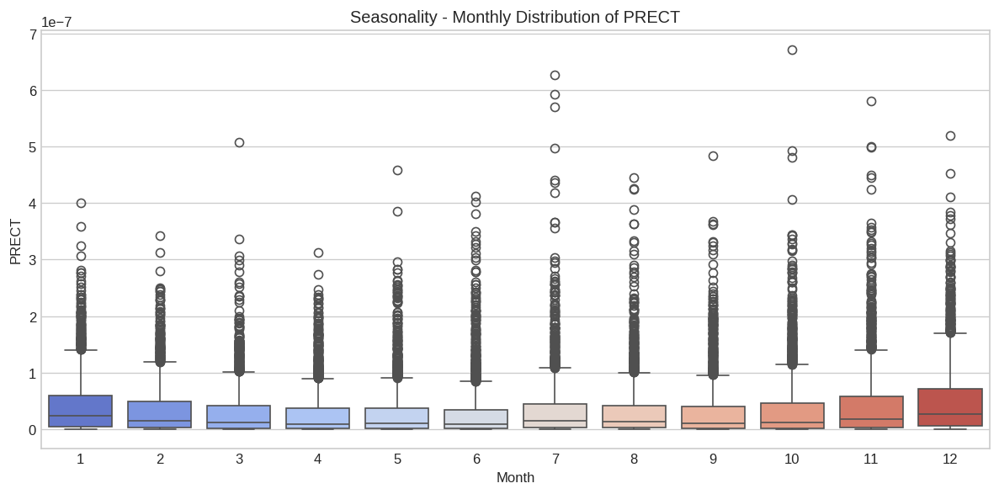

In [57]:
# ────────────────────────────────────────────────
# 5. Seasonality – Monthly boxplots
# ────────────────────────────────────────────────
for var in ['TREFMXAV_U', 'TREFHT', 'PRECT']:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x='month', y=var, data=df, palette='coolwarm')
    plt.title(f'Seasonality - Monthly Distribution of {var}')
    plt.xlabel('Month')
    plt.tight_layout()
    plt.savefig(f'seasonality_monthly_{var.lower()}.png', bbox_inches='tight')
    plt.show()

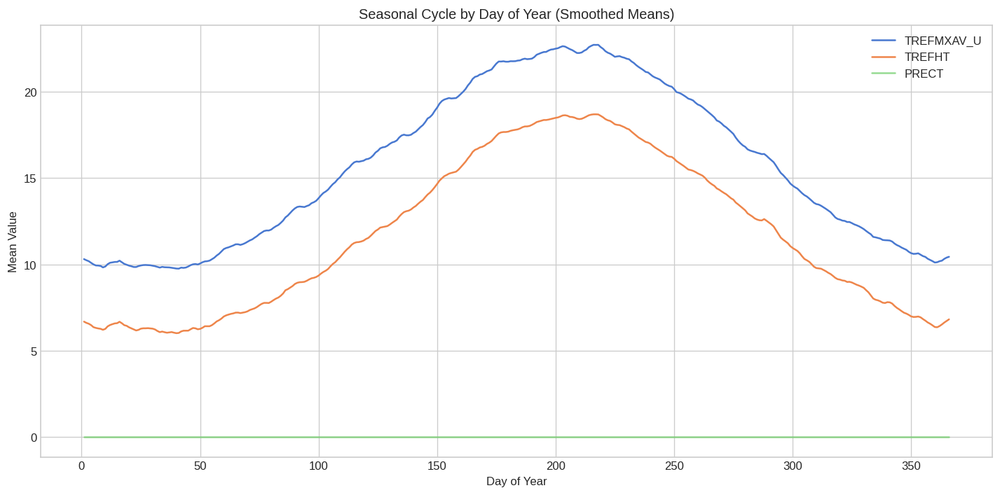

In [58]:
# ────────────────────────────────────────────────
# 6. Smoothed seasonal cycle by day of year
# ────────────────────────────────────────────────
doy_mean = df.groupby('dayofyear')[['TREFMXAV_U', 'TREFHT', 'PRECT']].mean()
# 7-day rolling mean for smoother curve
doy_smooth = doy_mean.rolling(window=7, center=True, min_periods=1).mean()

plt.figure(figsize=(12, 6))
plt.plot(doy_smooth.index, doy_smooth['TREFMXAV_U'], label='TREFMXAV_U')
plt.plot(doy_smooth.index, doy_smooth['TREFHT'],    label='TREFHT')
plt.plot(doy_smooth.index, doy_smooth['PRECT'],     label='PRECT', alpha=0.7)
plt.title('Seasonal Cycle by Day of Year (Smoothed Means)')
plt.xlabel('Day of Year')
plt.ylabel('Mean Value')
plt.legend()
plt.tight_layout()
plt.savefig('seasonal_cycle_dayofyear.png', bbox_inches='tight')
plt.show()

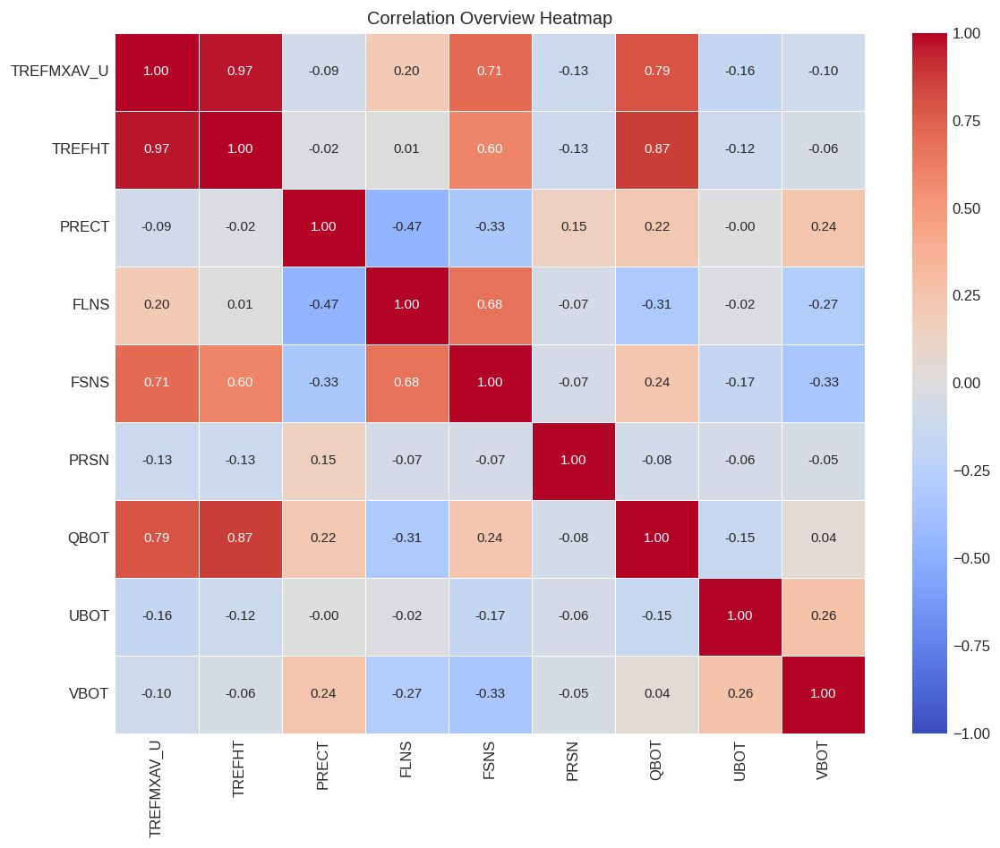

In [59]:
# ────────────────────────────────────────────────
# 7. Correlation heatmap
# ────────────────────────────────────────────────
corr = df[KEY_VARS].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1,
            linewidths=0.5, annot_kws={'size': 9})
plt.title('Correlation Overview Heatmap')
plt.tight_layout()
plt.savefig('correlation_heatmap.png', bbox_inches='tight')
plt.show()

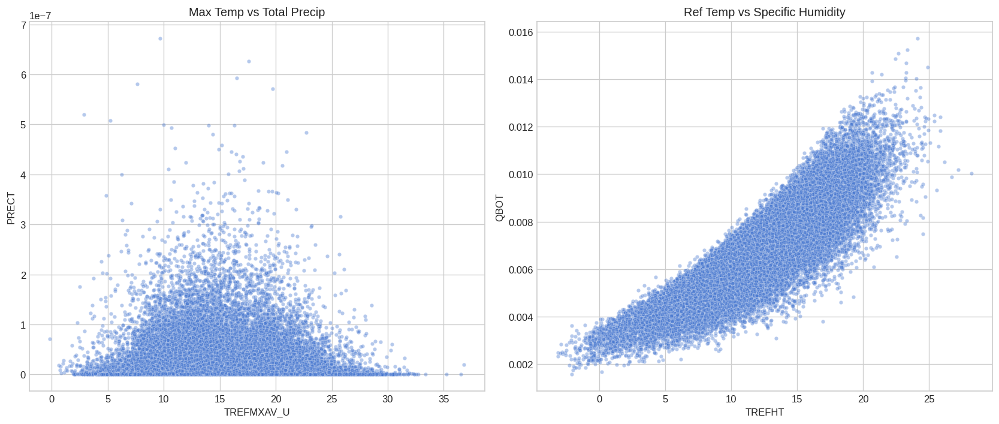

In [60]:
# ────────────────────────────────────────────────
# 8. Example multivariate scatter plots
# ────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.scatterplot(x='TREFMXAV_U', y='PRECT', data=df, ax=axes[0], alpha=0.4, s=15)
axes[0].set_title('Max Temp vs Total Precip')
axes[0].set_xlabel('TREFMXAV_U')
axes[0].set_ylabel('PRECT')

sns.scatterplot(x='TREFHT', y='QBOT', data=df, ax=axes[1], alpha=0.4, s=15)
axes[1].set_title('Ref Temp vs Specific Humidity')
axes[1].set_xlabel('TREFHT')
axes[1].set_ylabel('QBOT')

plt.tight_layout()
plt.savefig('multivariate_scatter_examples.png', bbox_inches='tight')
plt.show()

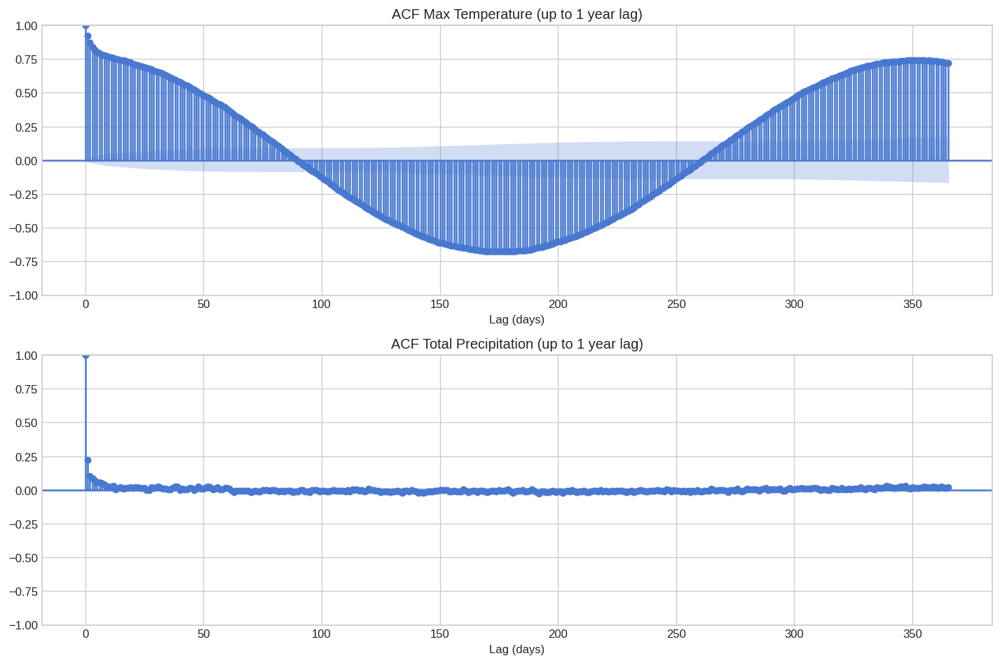

In [61]:
# ────────────────────────────────────────────────
# 9. ACF (lag analysis) – up to 365 days
# ────────────────────────────────────────────────
fig, axes = plt.subplots(2, 1, figsize=(12, 8))

plot_acf(df['TREFMXAV_U'], lags=365, ax=axes[0], title='ACF Max Temperature (up to 1 year lag)')
axes[0].set_xlabel('Lag (days)')

plot_acf(df['PRECT'], lags=365, ax=axes[1], title='ACF Total Precipitation (up to 1 year lag)')
axes[1].set_xlabel('Lag (days)')

plt.tight_layout()
plt.savefig('lag_analysis_acf.png', bbox_inches='tight')
plt.show()

##All of it

In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
import warnings
import os

warnings.filterwarnings('ignore')

# ────────────────────────────────────────────────
#  SETTINGS
# ────────────────────────────────────────────────
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("muted")
plt.rcParams['figure.dpi'] = 120
plt.rcParams['savefig.dpi'] = 150
plt.rcParams['figure.figsize'] = (12, 6)

# All 6 ensemble files (add more if you get them later)
FILE_PATHS = [
    "003_manchester_processed.csv",
    "004_manchester_processed.csv",
    "005_manchester_processed.csv",
    "006_manchester_processed.csv",
    "007_manchester_processed.csv",
    "008_manchester_processed.csv"
]

KEY_VARS = ['TREFMXAV_U', 'TREFHT', 'PRECT', 'FLNS', 'FSNS', 'PRSN', 'QBOT', 'UBOT', 'VBOT']

In [63]:
# ────────────────────────────────────────────────
# 1. Load ALL ensembles + add ensemble identifier
# ────────────────────────────────────────────────
dfs = {}
full_df = pd.DataFrame()

for path in FILE_PATHS:
    ens_id = path.split('_')[0]                     # e.g. "003"
    df = pd.read_csv(path, parse_dates=['time'])
    df['ensemble'] = ens_id
    df['year'] = df['time'].dt.year
    df['month'] = df['time'].dt.month
    df['dayofyear'] = df['time'].dt.dayofyear

    dfs[ens_id] = df
    full_df = pd.concat([full_df, df], ignore_index=True)

print(f"Loaded {len(dfs)} ensembles • Total rows: {len(full_df):,}")
print("Date range (first ensemble):", full_df['time'].min(), "–", full_df['time'].max())
print("\nMissing values per column (should be 0 everywhere):")
print(full_df.isna().sum())

Loaded 6 ensembles • Total rows: 157,932
Date range (first ensemble): 2006-01-02 00:00:00 – 2080-12-31 00:00:00

Missing values per column (should be 0 everywhere):
time          0
TREFMXAV_U    0
FLNS          0
FSNS          0
PRECT         0
PRSN          0
QBOT          0
TREFHT        0
UBOT          0
VBOT          0
lat           0
lon           0
year          0
month         0
day           0
dayofyear     0
ensemble      0
dtype: int64


In [64]:
# ────────────────────────────────────────────────
# 2. Quick summary statistics per ensemble
# ────────────────────────────────────────────────
summary = full_df.groupby('ensemble')[KEY_VARS].describe().round(3)
print("Summary statistics across ensembles (mean ± std shown below):")
display(summary.loc[:, (slice(None), ['mean', 'std'])])   # only mean & std for readability

Summary statistics across ensembles (mean ± std shown below):


TREFMXAV_U         TREFHT        PRECT         FLNS            FSNS  \
               mean    std    mean    std  mean  std    mean     std    mean   
ensemble                                                                       
003          15.564  5.231  11.633  4.986   0.0  0.0  42.566  21.261  95.159   
004          15.581  5.186  11.645  4.970   0.0  0.0  42.587  21.295  95.158   
005          15.669  5.183  11.739  4.948   0.0  0.0  42.734  21.420  95.588   
006          15.801  5.145  11.860  4.902   0.0  0.0  42.698  21.380  95.721   
007          15.554  5.275  11.618  5.031   0.0  0.0  42.678  21.388  95.308   
008          15.575  5.265  11.616  5.025   0.0  0.0  42.991  21.473  95.657   

                 PRSN        QBOT          UBOT          VBOT         
             std mean  std   mean    std   mean    std   mean    std  
ensemble                                                              
003       74.239  0.0  0.0  0.007  0.002  1.204  3.078  1.533  2.955  
004       73.910  0.0  0.0  0.007  0.002  1.195  3.052  1.548  2.934  
005       74.578  0.0  0.0  0.007  0.002  1.192  3.099  1.517  2.941  
006       74.675  0.0  0.0  0.007  0.002  1.240  3.059  1.597  2.916  
007       74.417  0.0  0.0  0.006  0.002  1.258  3.077  1.514  2.936  
008       74.690  0.0  0.0  0.006  0.002  1.309  3.071  1.573  2.941

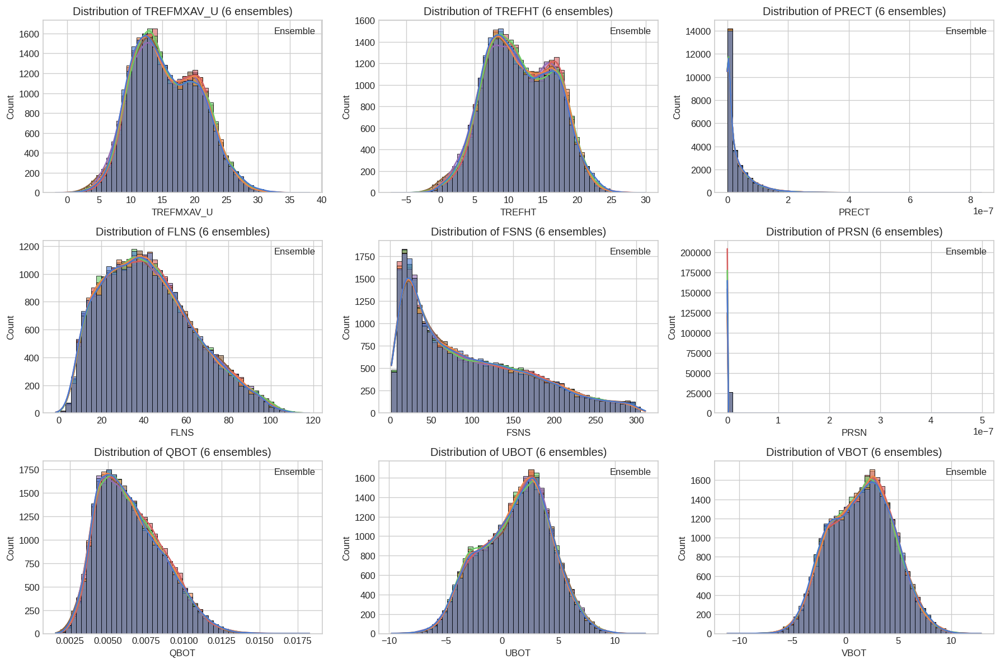

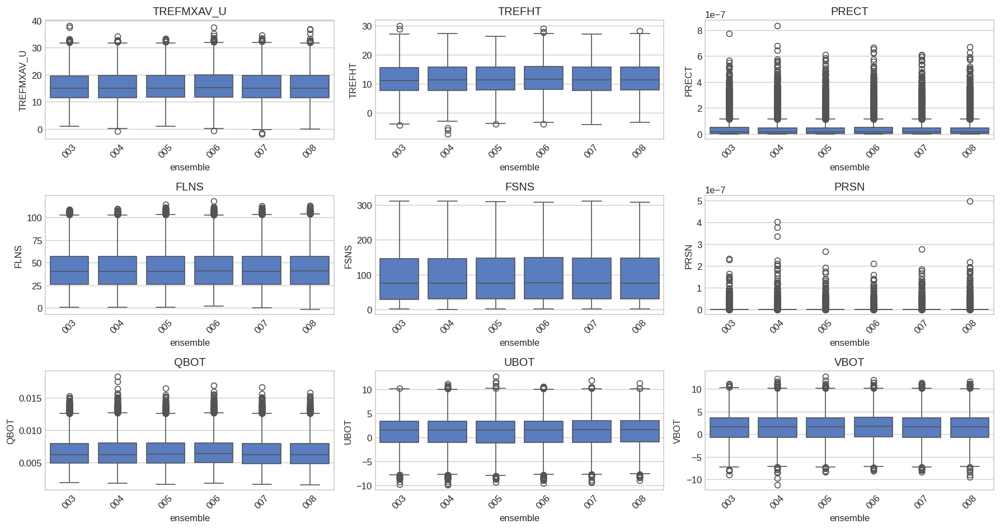

In [65]:
# ────────────────────────────────────────────────
# 3. Distributions – Histograms + Boxplots (all ensembles together)
# ────────────────────────────────────────────────
fig, axes = plt.subplots(3, 3, figsize=(15, 10))
axes = axes.ravel()

for i, var in enumerate(KEY_VARS):
    # Histogram with KDE (faceted by ensemble)
    sns.histplot(data=full_df, x=var, hue='ensemble', ax=axes[i],
                 kde=True, bins=50, alpha=0.6, common_norm=False)
    axes[i].set_title(f'Distribution of {var} (6 ensembles)')
    axes[i].legend(title='Ensemble', fontsize=8, loc='upper right')

plt.tight_layout()
plt.savefig('distributions_key_vars_ALL_ensembles.png', bbox_inches='tight')
plt.show()

# Bonus: Boxplot summary (quick visual of spread across ensembles)
fig, axes = plt.subplots(3, 3, figsize=(15, 8))
axes = axes.ravel()
for i, var in enumerate(KEY_VARS):
    sns.boxplot(data=full_df, x='ensemble', y=var, ax=axes[i])
    axes[i].set_title(var)
    axes[i].tick_params(axis='x', rotation=45)
plt.tight_layout()
plt.savefig('boxplots_key_vars_by_ensemble.png', bbox_inches='tight')
plt.show()

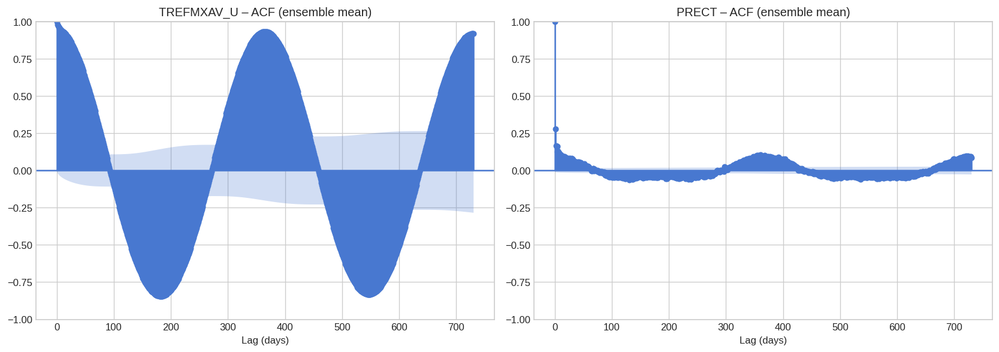

✅ Strong 365-day peaks in temperature (seasonal persistence).
✅ Precipitation autocorrelation decays much faster – typical for daily rainfall.


In [66]:
# ────────────────────────────────────────────────
# 4. Lag analysis (ACF) – temperature & precipitation (averaged)
# ────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Average daily series across ensembles (for clean seasonality signal)
avg_df = full_df.groupby('time')[['TREFMXAV_U', 'PRECT']].mean()

# Temperature ACF (up to 730 days = 2 years)
plot_acf(avg_df['TREFMXAV_U'].values, lags=730, ax=axes[0], title="TREFMXAV_U – ACF (ensemble mean)")
axes[0].set_xlabel("Lag (days)")

# Precipitation ACF (decays faster)
plot_acf(avg_df['PRECT'].values, lags=730, ax=axes[1], title="PRECT – ACF (ensemble mean)")
axes[1].set_xlabel("Lag (days)")

plt.tight_layout()
plt.savefig('ACF_temperature_precip_ensemble_mean.png', bbox_inches='tight')
plt.show()

print("✅ Strong 365-day peaks in temperature (seasonal persistence).")
print("✅ Precipitation autocorrelation decays much faster – typical for daily rainfall.")

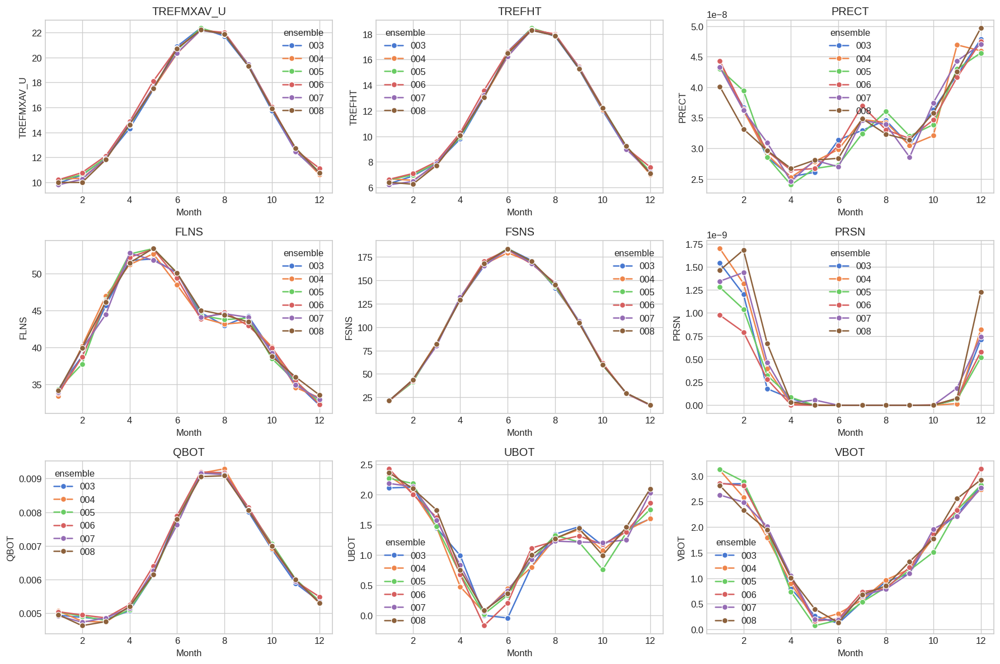

In [67]:
# ────────────────────────────────────────────────
# 5. Monthly climatology (ensemble mean + spread)
# ────────────────────────────────────────────────
monthly = full_df.groupby(['ensemble', 'month'])[KEY_VARS].mean().reset_index()

fig, axes = plt.subplots(3, 3, figsize=(15, 10))
axes = axes.ravel()
for i, var in enumerate(KEY_VARS):
    sns.lineplot(data=monthly, x='month', y=var, hue='ensemble', ax=axes[i], marker='o')
    axes[i].set_title(var)
    axes[i].set_xlabel("Month")
plt.tight_layout()
plt.savefig('monthly_climatology_by_ensemble.png', bbox_inches='tight')
plt.show()

##General insights on EDA
- All 6 ensembles (datasets) are extremely consistent (almost identical means and spreads for every variable). This is expected for different realizations of the same climate model.

- Temperature variables (TREFMXAV_U, TREFHT) show clear bimodal / seasonal distributions and very strong 365-day autocorrelation – exactly similar to what is seen in the first dataset.
- Precipitation (PRECT, PRSN) is highly skewed (lots of zeros) and loses autocorrelation quickly, which is useful for any lag-feature engineering or stochastic weather generators.

- Radiation fluxes (FLNS, FSNS) and humidity/wind variables (QBOT, UBOT, VBOT) behave very similarly across the dataset ensembles. This indicates a low inter-ensemble uncertainty for these fields at the Manchester grid point.

- No missing values, same date range (2006-01-02 to 2080-12-31) in every file and hence it is very safe to treat as a clean 6-member ensemble and therefore suggests that data pre-processing was conducted very well.
